In [1]:
#use wdtools_env_pip environment

import numpy as np
from math import log10, floor
from bisect import bisect_left
from scipy import stats
from tqdm import tqdm

import matplotlib.pyplot as plt
import matplotlib.colors as pltcolors
plt.style.use('Software/stefan.mplstyle')

import pandas as pd
pd.set_option('display.max_columns', None)
# Suppress SettingWithCopyWarnings
pd.options.mode.chained_assignment = None  # default='warn'

#for machine learning
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense
from tensorflow.keras.models import load_model


# This notebook trains a machine learning method to reconstruct the correlation length in the simulation with measurement noise added, but no improvement in measurement capabilities (IP=1) (simulation=5)
- Use a deep learning approach with a convolutional neural network. CNNs are designed to automatically learn hierarchical features from raw data (usually images), so they are well suited to detect the peak/drop-off structure in the Moran's I x Z-Score curve that is useful in identifying the correlation length without me needing to do manual feature extraction. 
    - Use just the 1D Moran's I x Z-Score curve, don't include the distance array since the CNN will learn that scale from the labeled true correlation length
    - Don't cut the peak at small distances since the CNN should learn that feature doesn't necessarily drive the labeled true correlation length

# Import the simulation outputs

In [2]:
def get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type,nonzero_weight_cut=20,plot=True):
    #read back in measurements
    noise_label="".join(noise_effect_array)
    
    #sample_type='training','testing', or 'bootstrap'
    if sample_type=='training':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']
        
    if sample_type=='testing':
        #read back in measurements
        npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
        med_abs_deviations = npzfile['med_abs_deviations']

    Ws = npzfile['Ws']
    final_distances = npzfile['distances']
    moransIs = npzfile['moransIs'] 
    expectations = npzfile['expectations']
    variances = npzfile['variances']
    zscores = npzfile['zscores']
    
    mult=[]
    for i in range(len(moransIs)):
        mult.append(moransIs[i]*zscores[i])
        
    #cut to make sure have enough nonzero weights for valid results
    index = bisect_left(Ws, nonzero_weight_cut)
    
    if plot:
        #plot
        fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(6,15),sharex=True)
        ax1.plot(final_distances,moransIs)
        ax1.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax1.axvline(corr_length,color='green',label='True Correlation\nLength')
        ax1.axhline(expectations[0],color='red',label='No Correlation')
        ax1.set_ylabel("Moran's I")
        ax1.legend()

        ax2.plot(final_distances,zscores)
        ax2.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax2.axvline(corr_length,color='green')
        ax2.set_ylabel('Z-score')

        ax3.plot(final_distances,mult)
        ax3.axvspan(0,final_distances[index],color='red',alpha=0.5,label='Too Few WDs')
        ax3.axvline(corr_length,color='green')
        ax3.set_xlabel('Distance Cut')
        ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

        plt.subplots_adjust(wspace = 0,hspace=0)
        plt.show()
    
    return(final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index)


In [3]:
def count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,sample_type):
    
    #turn into combined simulation parameter array
    simulation_params=[]
    for corr_length in corr_lengths:
        for epsilon in epsilons:
            simulation_params.append([corr_length,epsilon])
            
    noise_label="".join(noise_effect_array)
    
    simulation_params_not_run=[]
    simulation_params_run=[]
    
    #check if each training data simulation has been run
    for i in range(len(simulation_params)):
        simulation=simulation_params[i]
        corr_length=simulation[0]
        epsilon=simulation[1]
        try:
            if sample_type=='training':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/training_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            if sample_type=='testing':
                #read back in measurements
                npzfile = np.load('csv/nb04_sample_size_'+str(sample_size)+'/'+noise_label+'_'+str(improvement_factor)+'_'+str(effect_strength)+'_'+str(chance_companion)+'_'+str(remove_likely_binaries)+'/testing_data/ep_'+str(epsilon)+'_corr_'+str(corr_length)+'.npz')
            simulation_params_run.append(simulation)
            #print('Simulation exists, ', simulation)
        except:
            simulation_params_not_run.append(simulation)
            #print('No simulation exists, ', simulation)

    return(simulation_params_run,simulation_params_not_run)


In [4]:
#for training data
corr_lengths=np.round(np.append(np.linspace(1,98,30)[1:],np.logspace(2,3,num=100)[1:-1]),2)
def round_sig(x,sig):
    return round(x, sig-int(floor(log10(abs(x))))-1)
epsilons_init=np.append(np.logspace(-10,-1,num=20),np.linspace(0.1,0.5,4)[1:])
epsilons=[]
for e in epsilons_init:
    epsilons.append(round_sig(e,2))

#for testing data
corr_lengths_testing=[10,25,50,75,100,150,200,250,300,400,500,600,700,800,900,1000]
epsilons_testing=[1e-10,1e-7,1e-4,0.001,0.005,0.01,0.05,0.1,0.15,0.2,0.25,0.3,0.35,0.4,0.45,0.5]

In [5]:
sample_size=10207
noise_effect_array=['0','0','0','1','0']
improvement_factor=1
effect_strength=1
chance_companion=0.01
remove_likely_binaries='0'

#count how many simulations have been run

simulation_params_run,simulation_params_not_run=count_simulations(corr_lengths,epsilons,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

print('training')
print(len(simulation_params_run))
print(len(simulation_params_not_run))
print('')

simulation_params_run_testing,simulation_params_not_run_testing=count_simulations(corr_lengths_testing,epsilons_testing,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'testing')
print('testing')
print(len(simulation_params_run_testing))
print(len(simulation_params_not_run_testing))

training
2921
0

testing
256
0


559.08 0.23


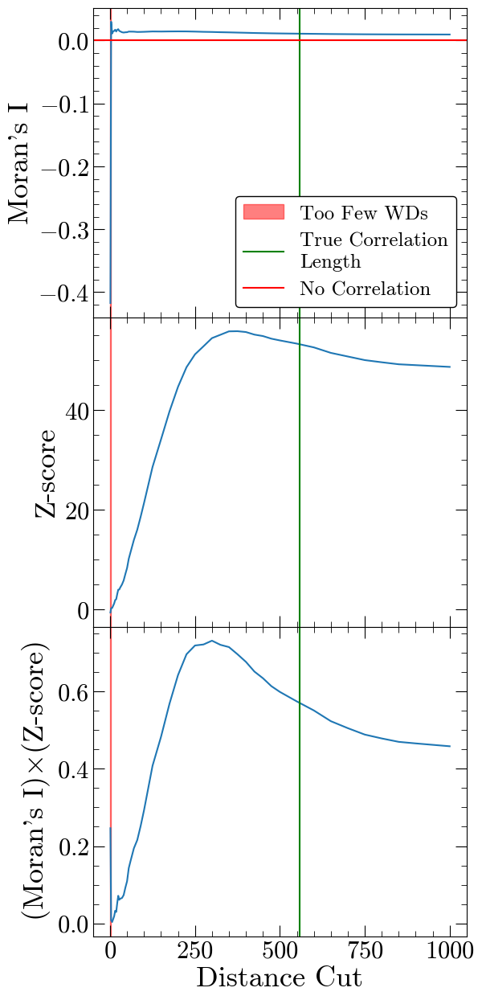

385.35 0.37


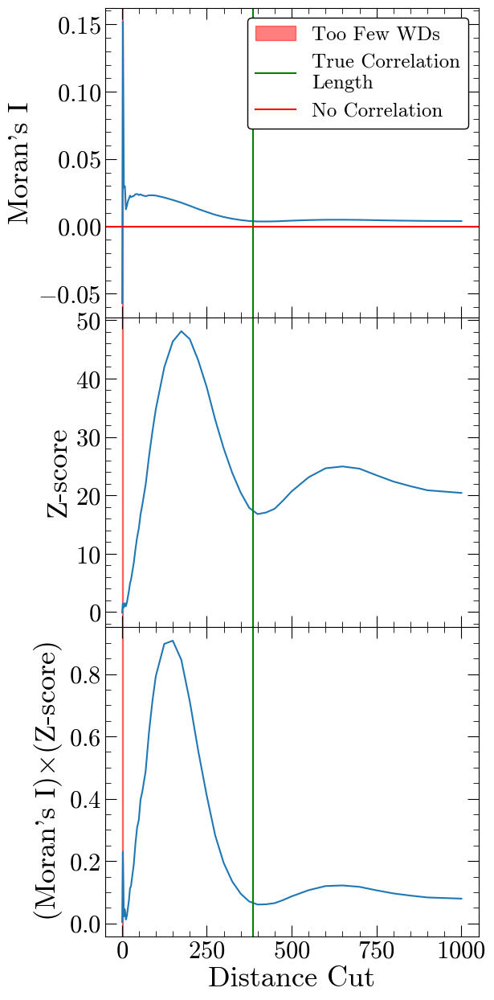

343.05 0.23


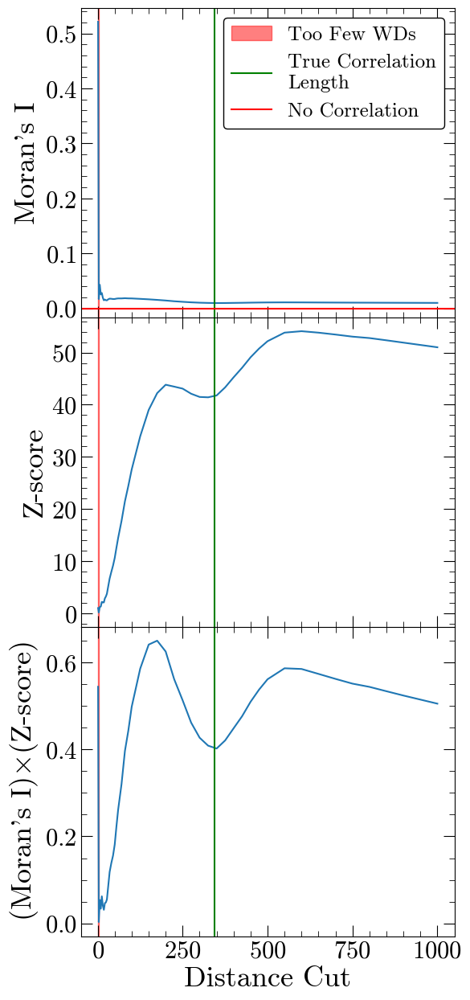

849.75 5.5e-06


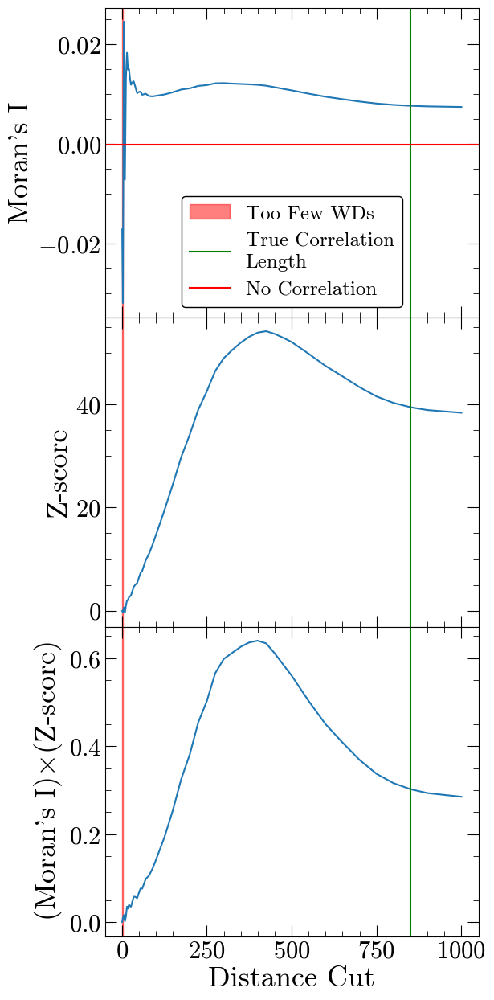

123.28 0.37


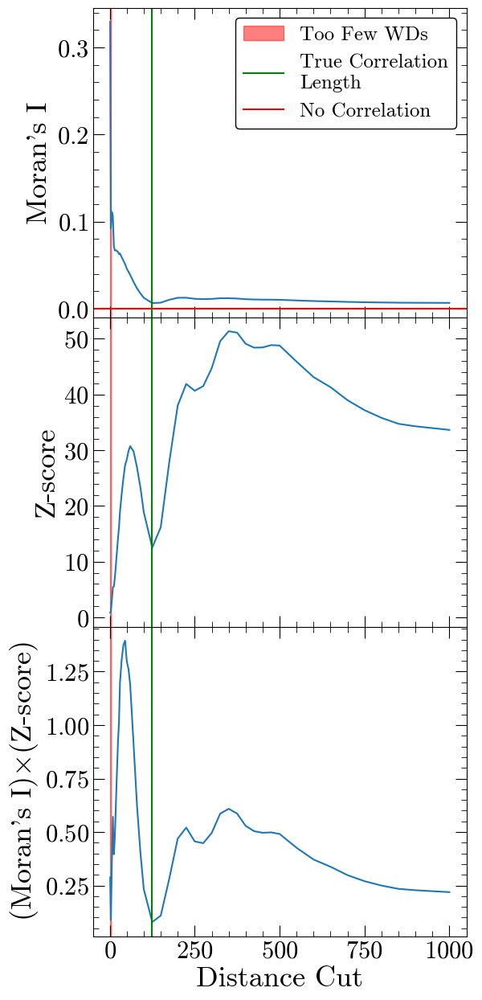

123.28 0.0038


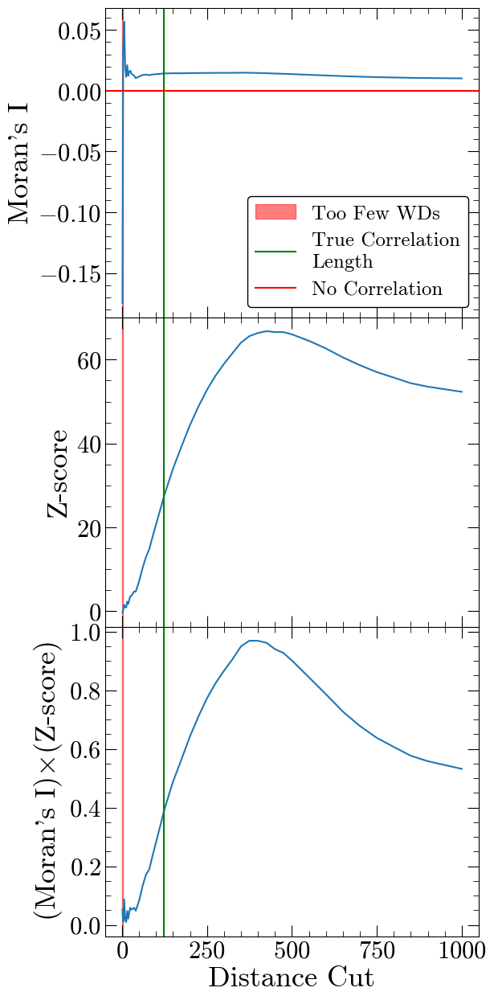

74.59 1.8e-06


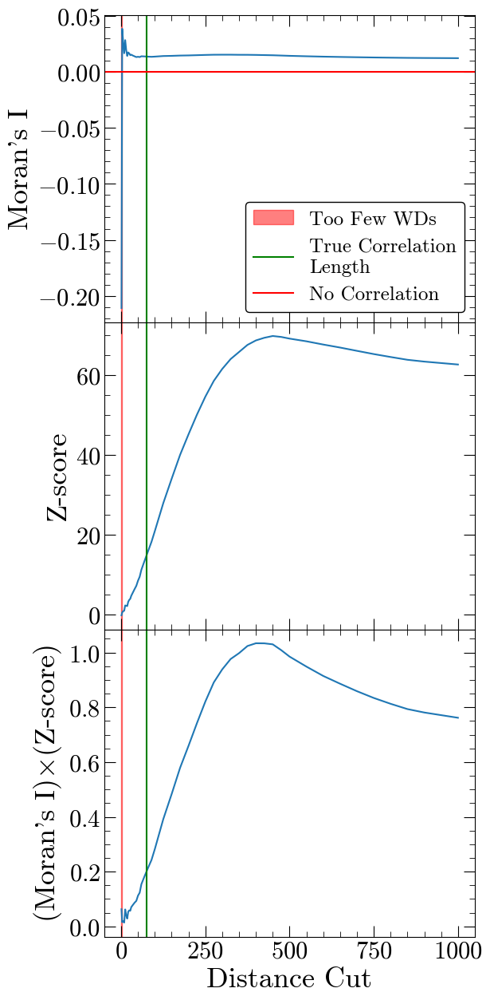

475.08 1.8e-06


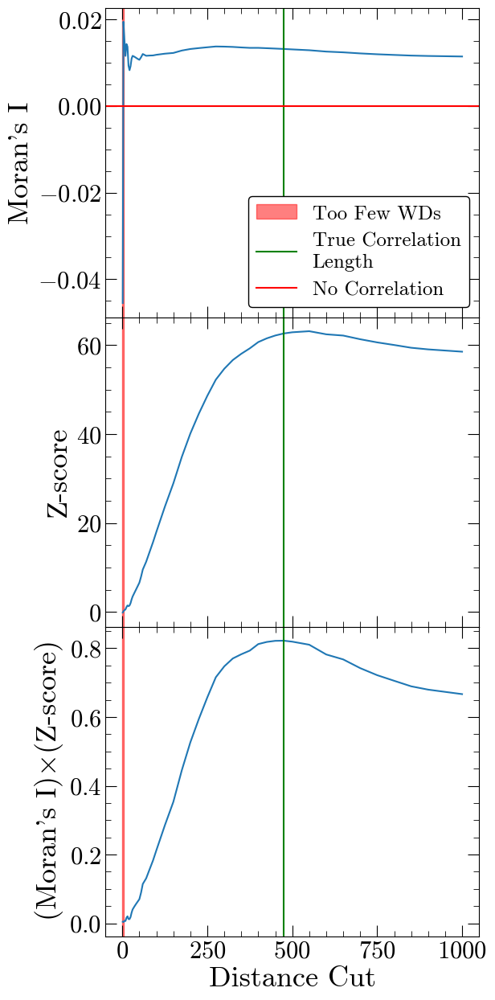

126.19 5.5e-06


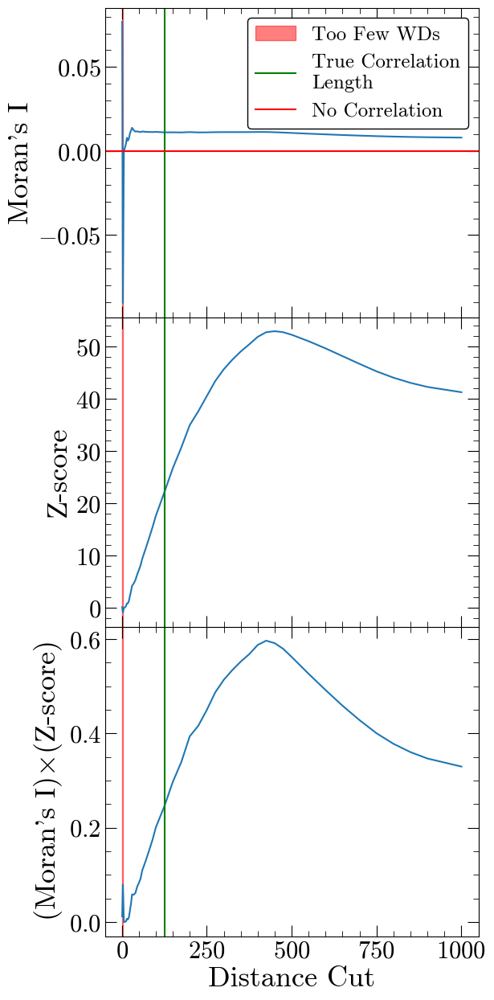

572.24 1.6e-05


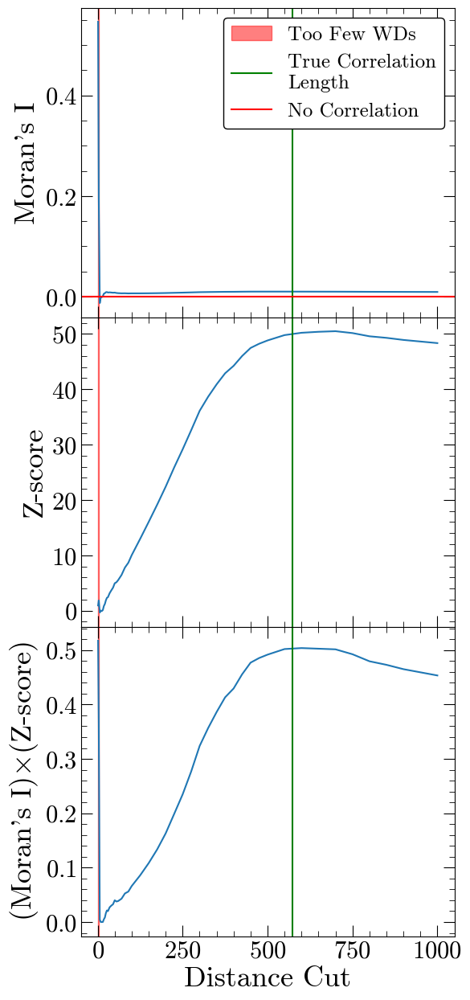

In [6]:
#display a few curves from the training data set
indices=np.random.randint(len(simulation_params_run), size=10)
for index in indices:
    corr_length=simulation_params_run[index][0]
    epsilon=simulation_params_run[index][1]
    print(corr_length,epsilon)
    sample_size=10207
    output=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                  remove_likely_binaries,'training')

# Make a representative plot of various epsilons and correlation lengths

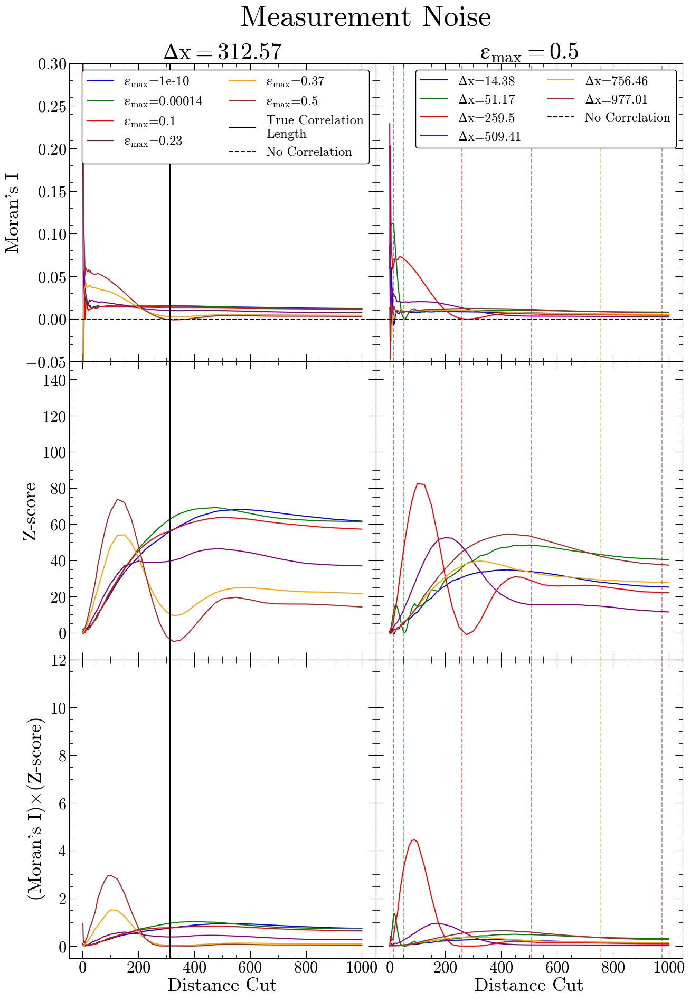

In [7]:
fig, ((ax1,ax4),(ax2,ax5),(ax3,ax6)) = plt.subplots(3,2,figsize=(15,22),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[1e-10,0.00014,0.1,0.23,0.37,0.5]#[1e-10,2.1e-07,0.00014,0.034,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon_{max}$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='upper right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    
#One epsilon length, various correlation lengths
epsilon=0.5
corr_lengths_subset=[14.38, 51.17, 259.5, 509.41, 756.46, 977.01]
for i in range(len(corr_lengths_subset)):
    corr_length=corr_lengths_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax4.plot(final_distances,moransIs,color=color,label='$\Delta x$='+str(corr_length))
    ax4.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax5.plot(final_distances,zscores,color=color)
    ax5.axvline(corr_length,color=color,linestyle='--',alpha=0.5)
    ax6.plot(final_distances,mult,color=color)  
    ax6.axvline(corr_length,color=color,linestyle='--',alpha=0.5)

ax4.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax4.legend(ncol=2,loc='upper right')

ax6.set_xlabel('Distance Cut')

ax4.set_title('$\epsilon_{max}=$'+str(epsilon))

#clean up the plot
ax1.set_ylim(-0.05,0.3)
ax4.set_ylim(-0.05,0.3)

ax2.set_ylim(-15,150)
ax5.set_ylim(-15,150)

ax3.set_ylim(-0.5,12)
ax6.set_ylim(-0.5,12)

ax4.set_yticklabels([]) 
ax5.set_yticklabels([]) 
ax6.set_yticklabels([]) 

fig.suptitle('Measurement Noise', fontsize=40, x=0.5, y=0.93)
plt.subplots_adjust(wspace = 0,hspace=0)

plt.savefig('curves_measurement_noise.pdf', dpi=300)#, pad_inches=0.3)

(0.01, 0.05)

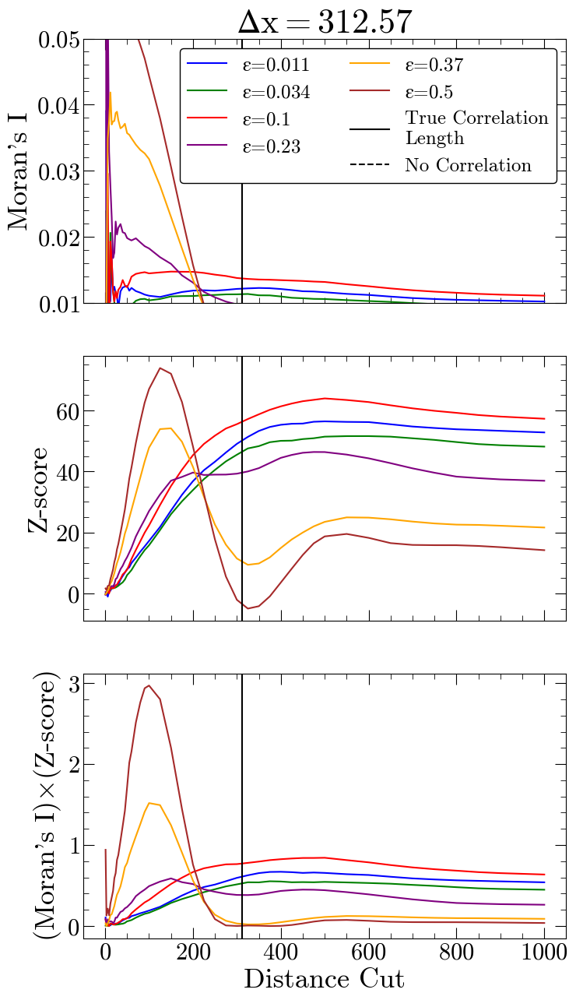

In [8]:
#find minimum visible epsilon

#min=0.23
fig, ((ax1),(ax2),(ax3)) = plt.subplots(3,1,figsize=(8,15),sharex=True)

colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown']

#One correlation length, various epsilons
corr_length=312.57
epsilons_subset=[0.011,0.034,0.1,0.23,0.37,0.5]
for i in range(len(epsilons_subset)):
    epsilon=epsilons_subset[i]
    color=colors[i]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    ax1.plot(final_distances,moransIs,color=color,label='$\epsilon$='+str(epsilon))
    ax2.plot(final_distances,zscores,color=color)
    ax3.plot(final_distances,mult,color=color)  
ax1.axvline(corr_length,color='black',label='True Correlation\nLength')
ax1.axhline(expectations[0],color='black',linestyle='--',label='No Correlation')
ax1.set_ylabel("Moran's I")
ax1.legend(ncol=2,loc='upper right')

ax2.axvline(corr_length,color='black',label='True Correlation\nLength')
ax2.set_ylabel('Z-score')

ax3.axvline(corr_length,color='black',label='True Correlation\nLength')
ax3.set_xlabel('Distance Cut')
ax3.set_ylabel(r"(Moran's I)$\times$(Z-score)")

ax1.set_title('$\Delta x=$'+str(corr_length))
    

#clean up the plot
ax1.set_ylim(0.01,0.05)
# ax2.set_ylim(-5,50)
# ax3.set_ylim(-.1,.1)


# Set up the training and testing data for the CNN

In [9]:
sample_size=10207

x_train=[]
y_train=[]
ep_train=[]
for simulation in simulation_params_run:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'training',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_train.append(normalized)
    #save correlation length as true label
    y_train.append(corr_length)
    #also save epsilon
    ep_train.append(epsilon)
    
x_train=np.array(x_train)
y_train=np.array(y_train)
ep_train=np.array(ep_train)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_train=np.nan_to_num(x_train)

#check for NaNs and Infs
print(np.isnan(x_train).any())
print(np.isinf(x_train).any())

training_data=pd.DataFrame()
training_data['y_true']=y_train
training_data['epsilon']=ep_train

training_data.head()

False
False


,y_true,epsilon
0,4.34,1.000000e-10
1,4.34,3.000000e-10
2,4.34,8.900000e-10
3,4.34,2.600000e-09
4,4.34,7.800000e-09


In [10]:
x_test=[]
y_test=[]
ep_test=[]
for simulation in simulation_params_run_testing:
    corr_length=simulation[0]
    epsilon=simulation[1]
    final_distances,med_abs_deviations,Ws,moransIs,expectations,variances,zscores,mult,index=get_output(corr_length,epsilon,sample_size,chance_companion,improvement_factor,effect_strength,noise_effect_array,
                                                                                                          remove_likely_binaries,'testing',plot=False)
    #Normalize then save Moran's I x Z-Score curve as 1D training data
    normalized=mult/np.nanmax(np.abs(mult))
    x_test.append(normalized)
    #save correlation length as true label
    y_test.append(corr_length)
    #also save epsilon
    ep_test.append(epsilon)
    
x_test=np.array(x_test)
y_test=np.array(y_test)
ep_test=np.array(ep_test)

#there are NaNs in the data set from the d = 1pc cut having no WDs at that separation, set these NaNs to 0
x_test=np.nan_to_num(x_test)

#check for NaNs and Infs
print(np.isnan(x_test).any())
print(np.isinf(x_test).any())

testing_data=pd.DataFrame()
testing_data['y_true']=y_test
testing_data['epsilon']=ep_test

testing_data.head()

False
False


,y_true,epsilon
0,10,1.000000e-10
1,10,1.000000e-07
2,10,1.000000e-04
3,10,1.000000e-03
4,10,5.000000e-03


### Train and Test different CNN configurations

In [28]:
def comparison_stats(data,verbose,success_fit=False,success_fit_threshold=0.1):
    if success_fit:
        init_len=len(data)
        data['abs_frac_err']=np.abs((data['y_true']-data['y_pred'])/data['y_true'])
        data=data.query('abs_frac_err<@success_fit_threshold')
        num_success=len(data)
        #reset the indices
        indices=np.arange(0,len(data))
        data.set_index(indices,inplace=True)
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=num_success/init_len
    else:
        y_true=data['y_true']
        y_pred=data['y_pred']
        frac_success=None
    
    error=y_true-y_pred
    frac_err=error/y_true
    
    #calculate the rmse
    rmse = 0
    for i in range(len(y_true)):
        rmse += (error[i])**2
    rmse = np.sqrt(rmse / len(y_true))
    
    #calculate the median absolute error between the datasets
    mae=np.median(np.abs(error))

    #calculate the bias between the datasets
    bias=np.median(error)
    
    #calculate the median absolute fractional error
    med_frac=np.median(np.abs(frac_err))
    
    if verbose:
        if success_fit:
            print(r'Frac Success Fit: {:2.3f} '.format(frac_success))
        print(r'RMSE: {:2.3f} '.format(rmse)+'pc')
        print(r'MAE: {:2.3f} '.format(mae)+'pc')
        print(r'BIAS: {:2.3f} '.format(bias)+'pc')
        print(r'MED FRAC ERR: {:2.3f} '.format(med_frac))
        
    return(rmse,mae,bias,med_frac,error,frac_err,frac_success)

In [29]:
def comparison_plots(training_data,testing_data,success_fit_threshold=0.1,statx=10,staty=700,statdy=50,lim='default', siegel=True,verbose=True):
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    if verbose:
        print('Training Stats')
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,verbose)
    if verbose:
        print('')
        print('Training Stats, Successful Fits')
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,verbose,True,success_fit_threshold)
    if verbose:
        print('')
        print('Testing Stats')
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,verbose)
    if verbose:
        print('')
        print('Testing Stats, Successful Fits')
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,verbose,True,success_fit_threshold)
    
    stats_df=pd.DataFrame()
    stats_df['mae_training']=[mae_training]
    stats_df['frac_success_training']=[frac_success_training]
    stats_df['mae_testing']=[mae_testing]
    stats_df['frac_success_testing']=[frac_success_testing]
    
    #plot the agreement with stats
    fig, (ax1,ax2) =plt.subplots(1,2,figsize=(16,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
        
    ax2.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax2.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax2.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'Measured Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax2.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax2.legend()
    if lim!='default':
        ax2.set_xlim((lim[0],lim[1]))
        ax2.set_ylim((lim[0],lim[1]))
    ax2.set_yscale('log')
    ax2.set_xscale('log')
    plt.show()
    
    #plot the agreement with trendlines
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'Measured Correlation Length (pc)')
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    #add a linear trendlines
    if siegel==True:
        coef = stats.siegelslopes(y_pred_testing, y_true_testing)
        poly1d_fn = np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    else:
        coef= np.polyfit(y_true_testing,y_pred_testing,1)
        poly1d_fn= np.poly1d(coef) 
        ax1.plot([minval,maxval], poly1d_fn([minval,maxval]), label="Trendline\n"+str(np.round(coef[0],2))+"*x+"+str(np.round(coef[1],2)))
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    plt.show()

    # plot the fractional error between the datasets
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.legend()
    plt.show()
    
    # plot the fractional error between the datasets
    # again but zoomed in
    fig, ax1 =plt.subplots(1,1,figsize=(8,8))
    ax1.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax1.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax1.axhline(med_frac_testing,color='green',label='MED ABS FRAC ERR = {:.3f}'.format(med_frac_testing_success))
    ax1.axhline(-med_frac_testing,color='green')
    ax1.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.3f}'.format(success_fit_threshold))
    ax1.axhline(-success_fit_threshold,color='blue')
    ax1.set_xlabel(r'True Correlation Length (pc)')
    ax1.set_ylabel(r'(True-Pred)/True')
    ax1.set_ylim((-1,1))
    ax1.legend()
    plt.show()
    
    return(stats_df)
    

In [30]:
#define a function to create the heatmap
def heatmap(data, row_labels, col_labels, ax=None):
    if not ax:
        ax = plt.gca()
        
    # Define color map with custom gradients
    cmap = plt.cm.viridis  # Default, replace with any colormap of your choice
    # Define boundaries for the color ranges
    boundaries = [0, 2, 4, 6, 8, 10, 1000]
    # Define colors corresponding to each range (make sure this matches the number of ranges)
    colors_for_ranges = [
    '#228B22',  # Forest Green
    '#32CD32',  # Lime Green
    '#FFD700',  # Gold (Yellow)
    '#FFA500',  # Orange
    '#FF4500',  # Orange Red
    '#DC143C',  # Crimson
    'black']
    # Create a ListedColormap and BoundaryNorm
    cmap = pltcolors.ListedColormap(colors_for_ranges)
    norm = pltcolors.BoundaryNorm(boundaries, cmap.N)
    
    # Plot the heatmap
    im = ax.imshow(data, cmap=cmap, norm=norm)
    
    #label rows/columns
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_xticklabels(col_labels)#, fontsize=10)
    ax.set_yticks(np.arange(data.shape[0]))
    ax.set_yticklabels(row_labels)
    
    #draw grid lines
    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="k", linestyle='-', linewidth=0.5,alpha=0.3)
    ax.tick_params(which="minor", bottom=False, left=False,top=False, right=False)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")
    return im

def heatmap_testing_data(testing_data,figtitle=None,savefig=False,figname=None):
    data=[]
    failed_fit_region_count=0
    for corr_len in corr_lengths_testing:
        tmp=[]
        for epsilon in epsilons_testing:
            val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
            tmp.append(val)
            if val>10:
                failed_fit_region_count+=1
        data.append(tmp)
    data=np.array(data)
    
    fig,ax0=plt.subplots(1, 1, figsize=(10, 10))
    ylabels=[str(i) for i in corr_lengths_testing]
    xlabels=[str(i) for i in epsilons_testing]
    hm=heatmap(data, ylabels, xlabels, ax=ax0)
    ax0.set_xlabel('$\epsilon$')
    ax0.set_ylabel('$\Delta x_{true}$')
    
    ax0.set_title(figtitle)
    
    #plot colorbar
    cbar_ax = fig.add_axes([0.94, 0.15, 0.02, 0.7])
    fig.colorbar(hm, cbar_ax)
    cbar_ax.set_ylabel("Absolute Percent Error")#,fontsize=16)
    
    if savefig:
        plt.savefig(figname+'.pdf', dpi=300)
        
    plt.show()
    print('Number of squares with abs percent err>10%, ', failed_fit_region_count)
    
    return(failed_fit_region_count)

In [44]:
def test_model(model,stats=True,plot=True):
    sample_size=10207
    
    # use the model to predict the training data
    y_pred_train = model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the testing data
    y_pred_test = model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold=0.1)
    
    if plot:
        #some runs return NaNs, show those fits
        nan_corr_lengths=testing_data[testing_data['y_pred'].isna()]
        print('')
        print('Showing the '+str(len(nan_corr_lengths))+' curves that returned NaNs')
        display(nan_corr_lengths)
        for i in range(len(nan_corr_lengths)):
            corr_length=nan_corr_lengths['y_true'].to_list()[i]
            epsilon=nan_corr_lengths['epsilon'].to_list()[i]
            output=get_output(corr_length,epsilon,sample_size,'testing',plot=True)

        #show comparison stats and plots
        stats_df=comparison_plots(training_data,testing_data)
        
        #show testing data absolute percent error heatmap
        failed_fit_region_count=heatmap_testing_data(testing_data) 
    else:
        stats_df=None
        nan_corr_lengths='Not saved!'
        failed_fit_region_count=0
        for corr_len in corr_lengths_testing:
            for epsilon in epsilons_testing:
                val=testing_data.query('y_true==@corr_len & epsilon==@epsilon')['abs_frac_err'].to_list()[0]*100
                if val>10:
                    failed_fit_region_count+=1
    
    if stats:
        return(stats_df)
    else:
        return(failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths)

# Pick models and tune the model hyperparameters

1. **Number of Filters in Convolutional Layers**
   The number of filters (also known as the number of output channels) determines the depth of the feature maps after each convolutional layer.
   **What to try:**
   - You can experiment with **increasing** the number of filters in each layer.
   - Alternatively, **decrease** the number of filters to make the model simpler and see if performance improves.
   
   Keep in mind that increasing the number of filters typically increases the model’s capacity, which can improve performance on more complex tasks but may also lead to overfitting if not properly regularized.

2. **Kernel Size**
   The kernel size defines the window of the convolution. 
   **What to try:**
   - **Larger kernel sizes** (e.g., 5 or 7) might capture broader patterns, which can be useful if the input data has long-range dependencies.
   - **Smaller kernel sizes** (e.g., 1 or 2) might be beneficial if you want to capture very fine-grained features.

3. **Number of Layers**
   The depth of the network can have a significant impact on its performance.
   **What to try:**
   - Adding more **convolutional layers** (e.g., 4 or 5 layers instead of 3) could help the model learn more complex patterns.
   - Alternatively, you can **reduce the number of layers** and see if performance improves, especially if overfitting is a concern.

4. **Pooling Layers**
   Pooling layers help reduce spatial dimensions and retain important features. You're using `MaxPooling1D(2)` after each convolution layer, which is a good starting point.
   **What to try:**
   - **Change the pooling size** (e.g., use `MaxPooling1D(3)` or `MaxPooling1D(4)`).
   - Experiment with different **types of pooling** (e.g., **AveragePooling1D**) to see if it affects performance.

5. **Dense Layer Units**
   In your current model, the final dense layer has 128 units with ReLU activation. The number of units in this layer controls the representational capacity of the fully connected portion of the network.
   **What to try:**
   - You can experiment with **increasing** or **decreasing** the number of units (e.g., try 64 or 256 units).
   - You can also **add another dense layer** between the existing dense layer and the output to increase the model's capacity.

6. **Optimizer and Learning Rate**
   You're using the **Adam optimizer** with its default settings, which is a good default choice for most tasks. However, adjusting the learning rate can have a significant impact on performance.
   **What to try:**
   - **Adjust the learning rate** (e.g., `learning_rate=0.001`, `learning_rate=0.0005`, `learning_rate=0.0001`).
   - You could also experiment with **different optimizers** (e.g., **SGD**, **RMSprop**) to see if they improve convergence speed or final accuracy.

7. **Batch Size**
   The batch size you’re currently using is 32, which is a standard choice.
   **What to try:**
   - Experiment with **larger batch sizes** (e.g., 64 or 128) to speed up training, or **smaller batch sizes** (e.g., 16 or 8) if you believe that could help the model generalize better.
   - Smaller batch sizes can help avoid local minima, while larger batch sizes usually converge faster.

8. **Regularization (Dropout or L2 Regularization)**
   You’re not using any regularization at the moment, which may cause overfitting, especially with a deep model.
   **What to try:**
   - **Dropout**: Add `Dropout` layers after the convolutional or dense layers to help prevent overfitting. Try dropout rates between 0.2 and 0.5.
   - **L2 Regularization**: Add L2 regularization to your layers, which helps penalize large weights and reduces overfitting. Example: `kernel_regularizer=l2(0.01)`.

9. **Activation Function**
   You're using ReLU as the activation function for all layers, which is quite common.
   **What to try:**
   - Experiment with different **activation functions** for the hidden layers, such as **LeakyReLU**, **ELU**, or **SELU**.
   - For the output layer, if you're predicting a continuous variable (since you're using `mse` loss), you may want to use a **linear activation** (which is the default for `Dense(1)`).


Epoch 1/100
92/92 [==============================] - 1s 4ms/step - loss: 110507.5469
Epoch 2/100
92/92 [==============================] - 0s 4ms/step - loss: 68565.7500
Epoch 3/100
92/92 [==============================] - 0s 4ms/step - loss: 68287.0625
Epoch 4/100
92/92 [==============================] - 0s 5ms/step - loss: 68005.2656
Epoch 5/100
92/92 [==============================] - 0s 5ms/step - loss: 67872.8125
Epoch 6/100
92/92 [==============================] - 0s 4ms/step - loss: 67538.2031
Epoch 7/100
92/92 [==============================] - 0s 4ms/step - loss: 67690.9062
Epoch 8/100
92/92 [==============================] - 0s 5ms/step - loss: 67501.5625
Epoch 9/100
92/92 [==============================] - 0s 5ms/step - loss: 67485.4375
Epoch 10/100
92/92 [==============================] - 0s 4ms/step - loss: 67429.6719
Epoch 11/100
92/92 [==============================] - 0s 4ms/step - loss: 67036.9688
Epoch 12/100
92/92 [==============================] - 0s 4ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 252.259 pc
MAE: 197.894 pc
BIAS: -69.197 pc
MED FRAC ERR: 0.580 

Training Stats, Successful Fits
Frac Success Fit: 0.104 
RMSE: 19.848 pc
MAE: 14.783 pc
BIAS: -1.714 pc
MED FRAC ERR: 0.055 

Testing Stats
RMSE: 298.644 pc
MAE: 210.695 pc
BIAS: -4.479 pc
MED FRAC ERR: 0.511 

Testing Stats, Successful Fits
Frac Success Fit: 0.152 
RMSE: 17.956 pc
MAE: 10.362 pc
BIAS: -7.319 pc
MED FRAC ERR: 0.041 


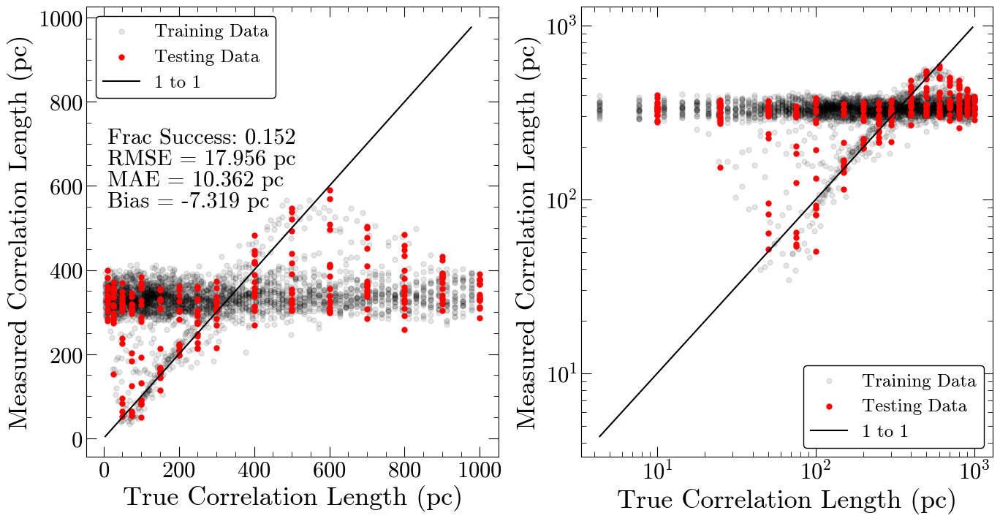

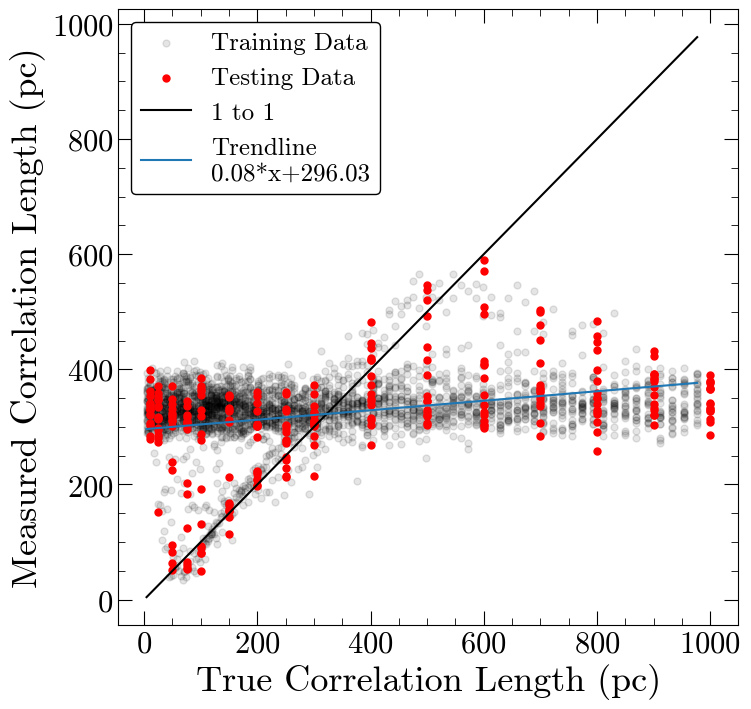

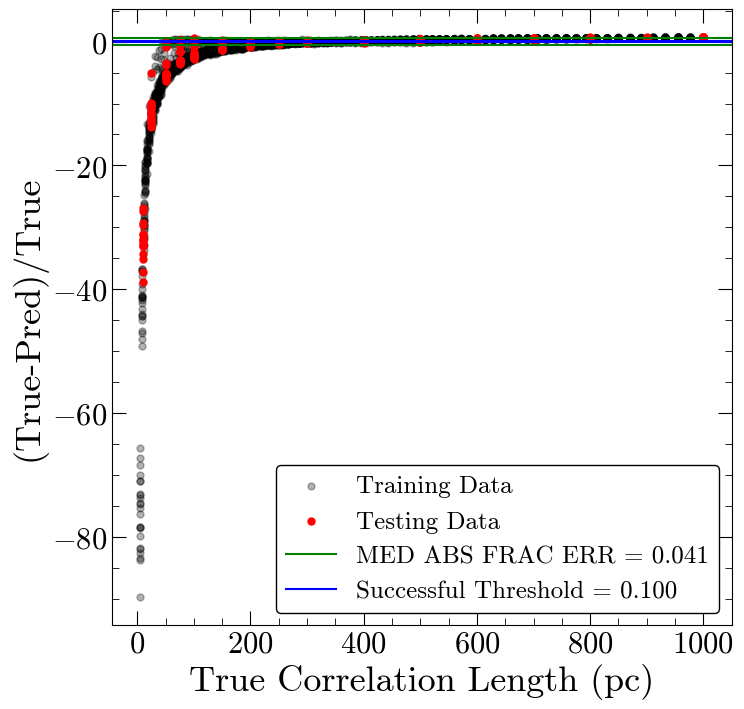

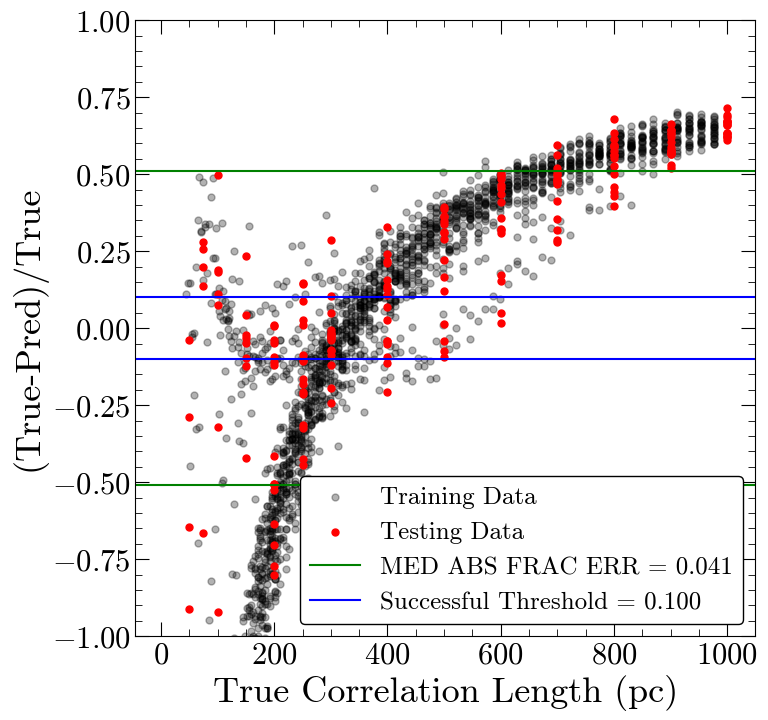

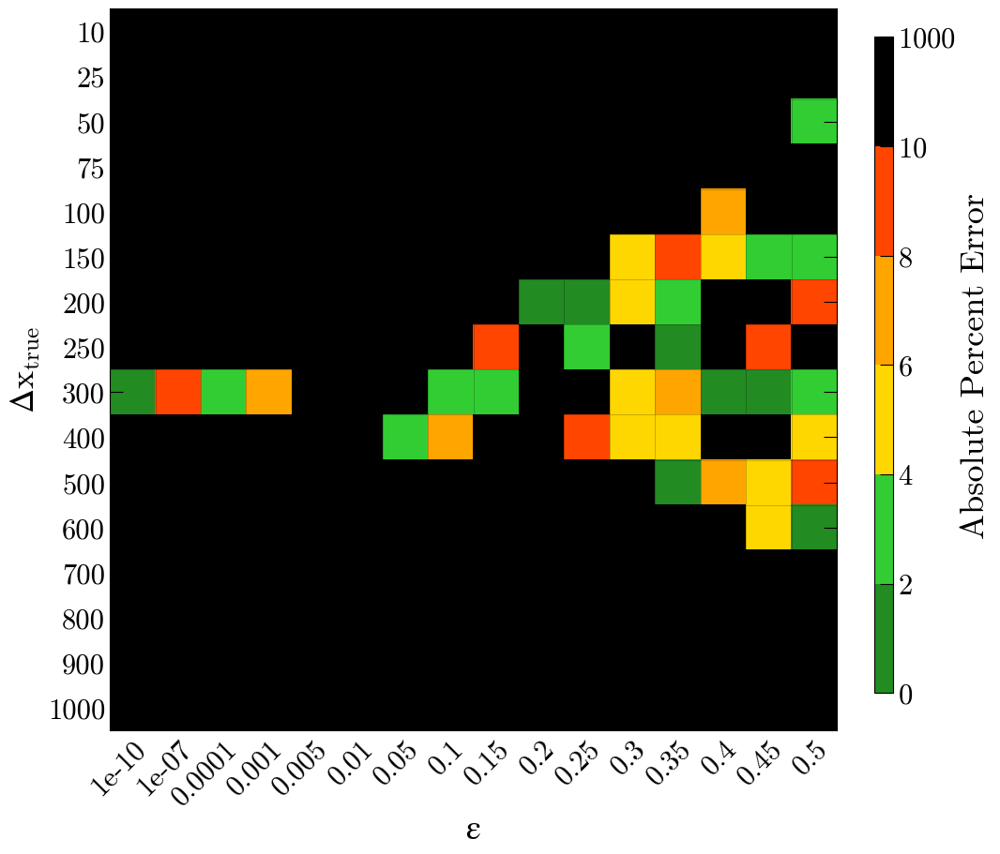

Number of squares with abs percent err>10%,  217


In [32]:
#simple model
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats for all models to compare and find best model
all_model_stats=output

Epoch 1/200
92/92 [==============================] - 1s 4ms/step - loss: 113687.6172
Epoch 2/200
92/92 [==============================] - 0s 5ms/step - loss: 68339.2734
Epoch 3/200
92/92 [==============================] - 1s 6ms/step - loss: 68074.2969
Epoch 4/200
92/92 [==============================] - 0s 5ms/step - loss: 67966.8750
Epoch 5/200
92/92 [==============================] - 0s 4ms/step - loss: 67915.8984
Epoch 6/200
92/92 [==============================] - 0s 4ms/step - loss: 67789.7344
Epoch 7/200
92/92 [==============================] - 0s 4ms/step - loss: 67253.5938
Epoch 8/200
92/92 [==============================] - 0s 5ms/step - loss: 67480.1484
Epoch 9/200
92/92 [==============================] - 1s 6ms/step - loss: 67234.9062
Epoch 10/200
92/92 [==============================] - 0s 5ms/step - loss: 67072.7266
Epoch 11/200
92/92 [==============================] - 1s 8ms/step - loss: 67242.0547
Epoch 12/200
92/92 [==============================] - 1s 6ms/step - loss:

92/92 [==============================] - 1s 7ms/step - loss: 62705.7305
Epoch 193/200
92/92 [==============================] - 1s 7ms/step - loss: 62673.6992
Epoch 194/200
92/92 [==============================] - 1s 8ms/step - loss: 62659.6211
Epoch 195/200
92/92 [==============================] - 1s 9ms/step - loss: 62463.7852
Epoch 196/200
92/92 [==============================] - 1s 11ms/step - loss: 62644.6875
Epoch 197/200
92/92 [==============================] - 1s 9ms/step - loss: 62847.8125
Epoch 198/200
92/92 [==============================] - 1s 6ms/step - loss: 62728.6211
Epoch 199/200
92/92 [==============================] - 1s 6ms/step - loss: 62785.9219
Epoch 200/200
92/92 [==============================] - 1s 6ms/step - loss: 62729.1328

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 249.914 pc
MAE: 191.296 pc
BIAS: -63.501 pc
MED FRAC ERR: 0.573 

Training Stats, Successful Fits
Frac Success Fit: 0.110 
RMSE: 19.045 pc
MAE: 13.937 pc
BIAS: 1.240 pc
MED FRAC ERR: 0.048 

Testing Stats
RMSE: 292.676 pc
MAE: 181.971 pc
BIAS: -5.419 pc
MED FRAC ERR: 0.513 

Testing Stats, Successful Fits
Frac Success Fit: 0.152 
RMSE: 18.328 pc
MAE: 7.213 pc
BIAS: -2.365 pc
MED FRAC ERR: 0.036 


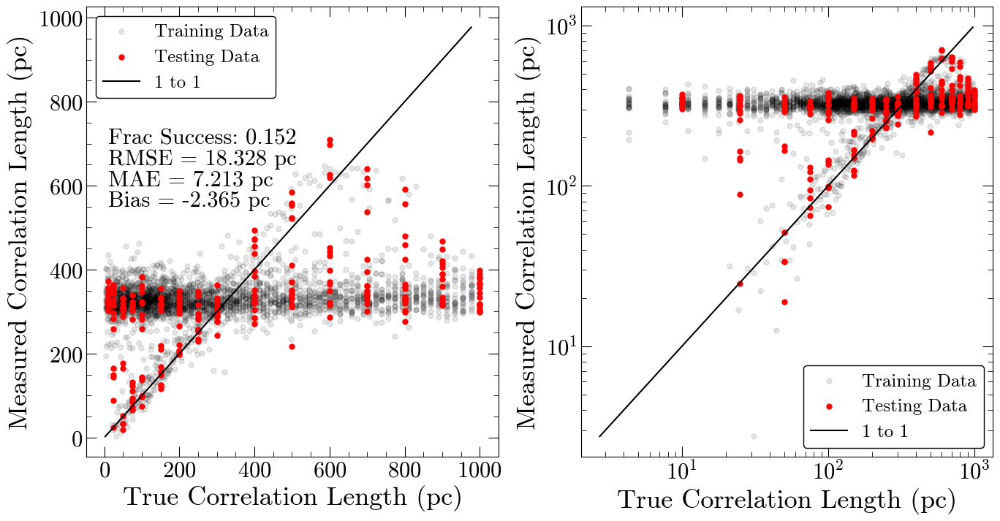

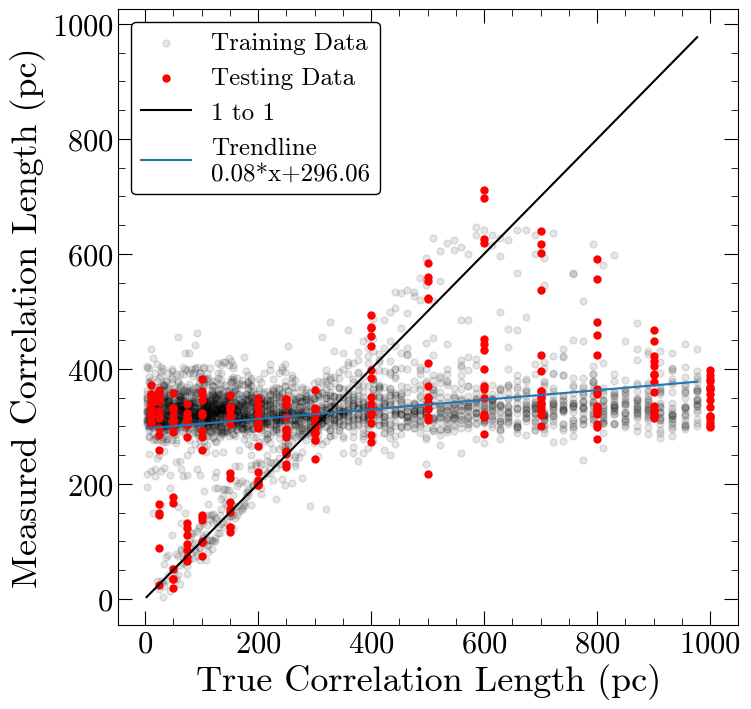

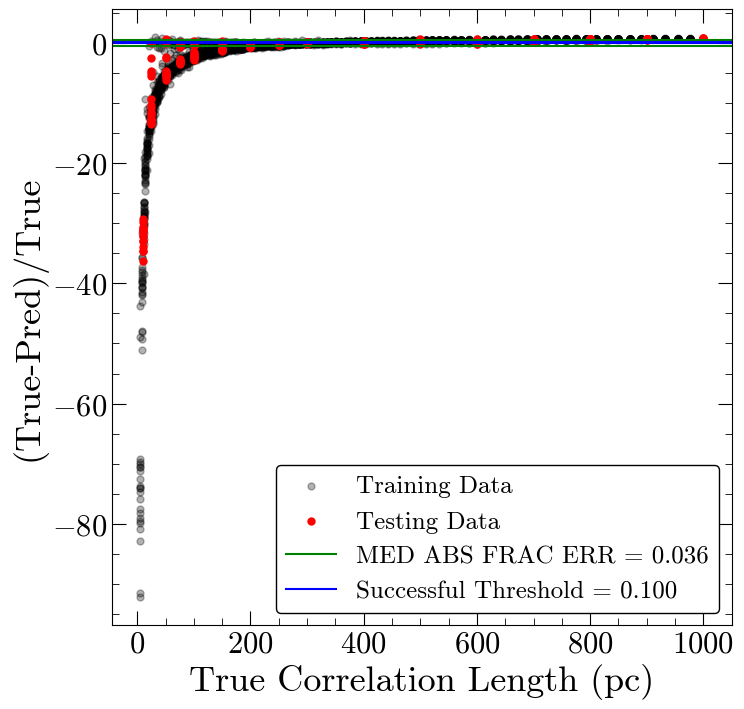

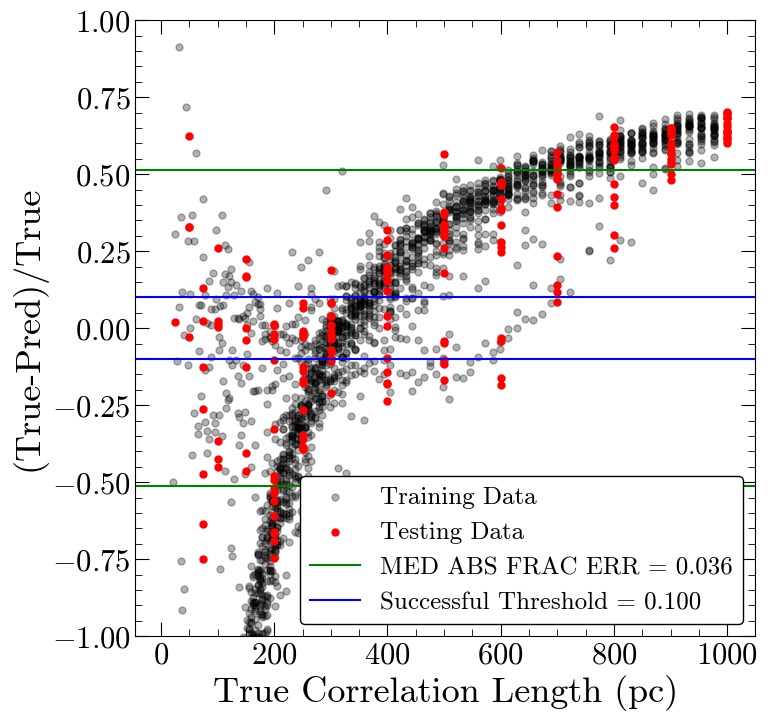

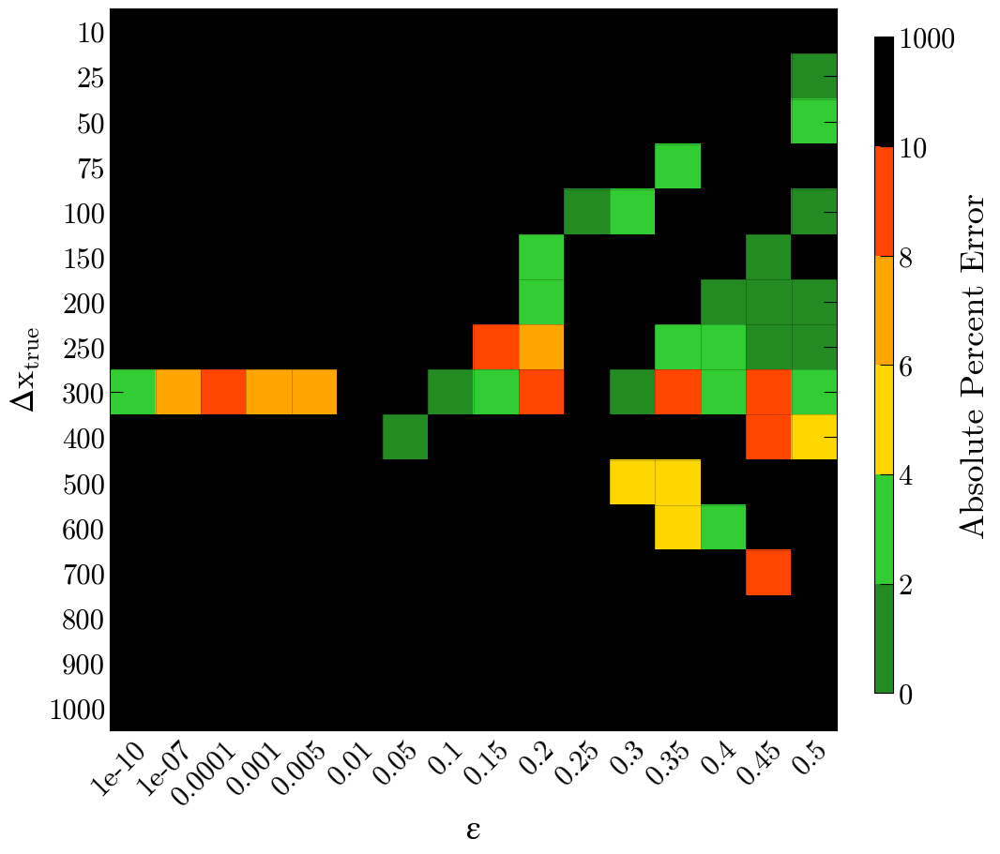

Number of squares with abs percent err>10%,  217


In [33]:
#simple model, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)),
    MaxPooling1D(2),
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2),
    Flatten(),
    Dense(64, activation='relu'), 
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 2s 11ms/step - loss: 102789.8750
Epoch 2/100
92/92 [==============================] - 1s 8ms/step - loss: 67875.6172
Epoch 3/100
92/92 [==============================] - 1s 10ms/step - loss: 67545.2734
Epoch 4/100
92/92 [==============================] - 1s 9ms/step - loss: 68790.2422
Epoch 5/100
92/92 [==============================] - 1s 11ms/step - loss: 67261.8125
Epoch 6/100
92/92 [==============================] - 1s 11ms/step - loss: 67214.7891
Epoch 7/100
92/92 [==============================] - 1s 10ms/step - loss: 67478.8516
Epoch 8/100
92/92 [==============================] - 1s 9ms/step - loss: 67602.9375
Epoch 9/100
92/92 [==============================] - 1s 14ms/step - loss: 67431.3203
Epoch 10/100
92/92 [==============================] - 2s 25ms/step - loss: 67442.5938
Epoch 11/100
92/92 [==============================] - 1s 11ms/step - loss: 67013.4922
Epoch 12/100
92/92 [==============================] - 1s 9ms/step

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 250.201 pc
MAE: 174.395 pc
BIAS: -35.465 pc
MED FRAC ERR: 0.579 

Training Stats, Successful Fits
Frac Success Fit: 0.122 
RMSE: 18.294 pc
MAE: 13.165 pc
BIAS: 5.296 pc
MED FRAC ERR: 0.049 

Testing Stats
RMSE: 298.972 pc
MAE: 194.419 pc
BIAS: 13.003 pc
MED FRAC ERR: 0.514 

Testing Stats, Successful Fits
Frac Success Fit: 0.188 
RMSE: 17.783 pc
MAE: 10.373 pc
BIAS: 5.567 pc
MED FRAC ERR: 0.039 


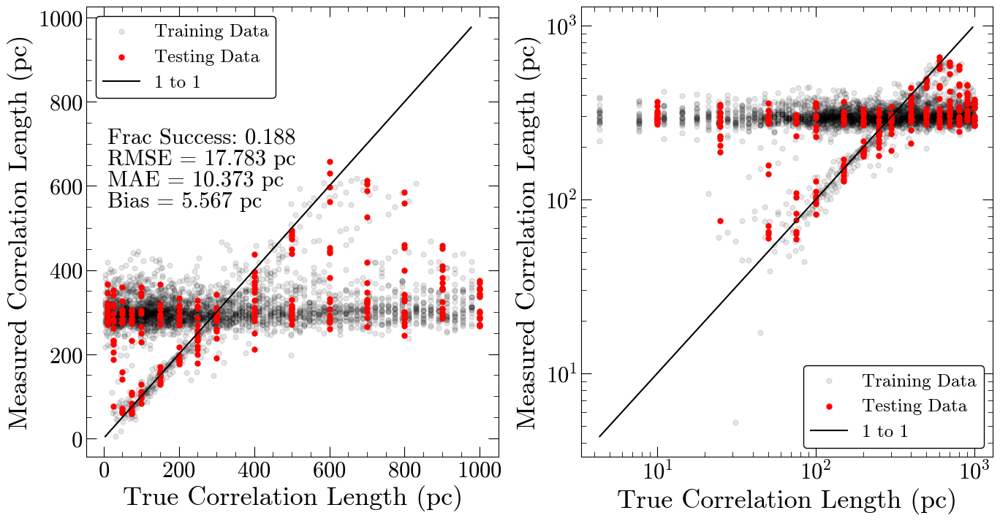

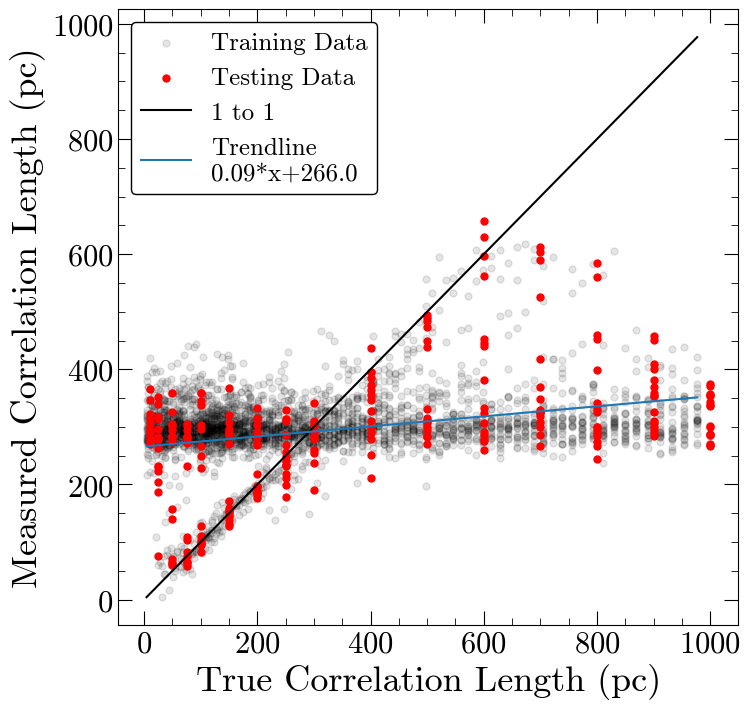

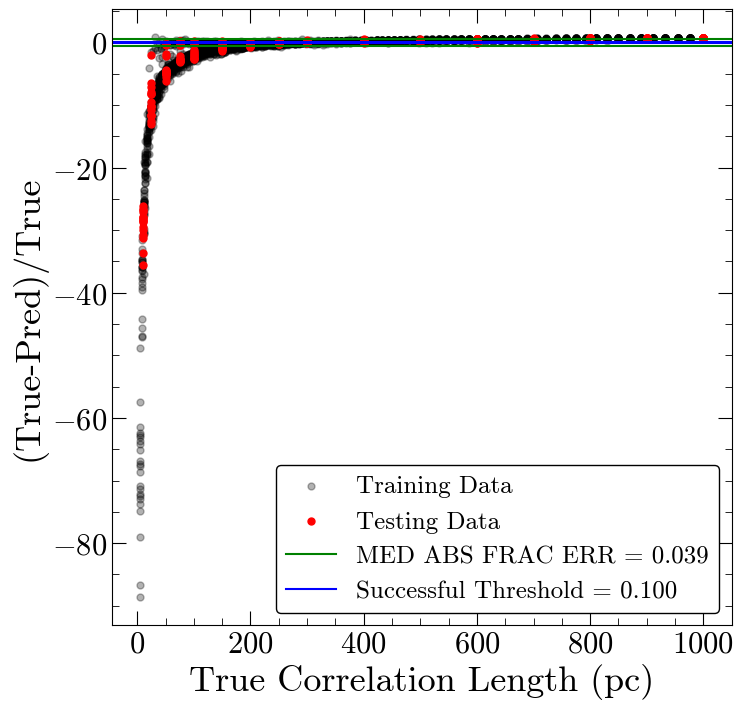

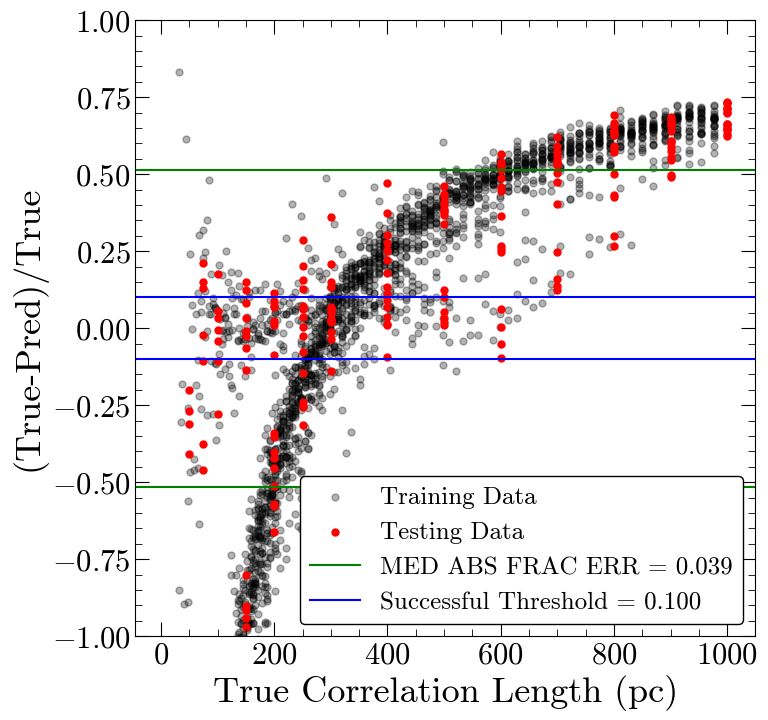

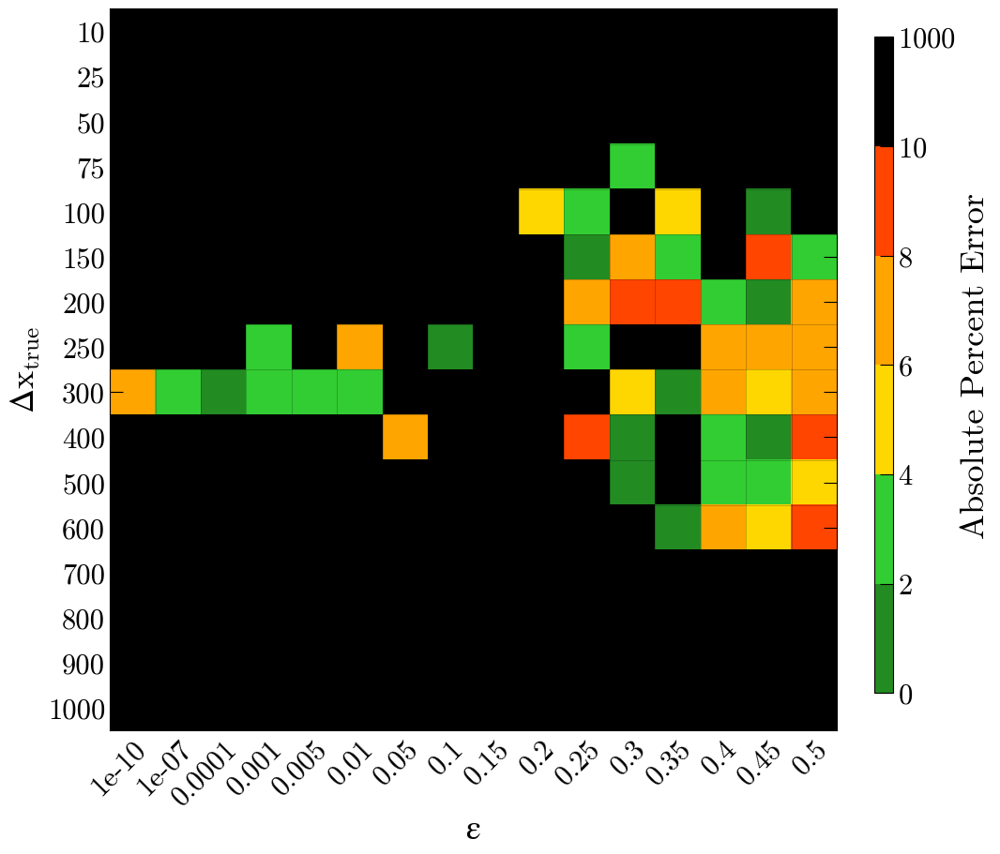

Number of squares with abs percent err>10%,  208


In [34]:
#model with more layers
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 2s 11ms/step - loss: 98216.0625
Epoch 2/200
92/92 [==============================] - 1s 10ms/step - loss: 68307.1016
Epoch 3/200
92/92 [==============================] - 1s 9ms/step - loss: 67952.0391
Epoch 4/200
92/92 [==============================] - 1s 9ms/step - loss: 67642.6016
Epoch 5/200
92/92 [==============================] - 1s 10ms/step - loss: 68154.2812
Epoch 6/200
92/92 [==============================] - 1s 11ms/step - loss: 67559.0625
Epoch 7/200
92/92 [==============================] - 1s 10ms/step - loss: 67312.7578
Epoch 8/200
92/92 [==============================] - 1s 12ms/step - loss: 67090.7578
Epoch 9/200
92/92 [==============================] - 1s 8ms/step - loss: 67262.2500
Epoch 10/200
92/92 [==============================] - 1s 9ms/step - loss: 67793.6797
Epoch 11/200
92/92 [==============================] - 1s 10ms/step - loss: 67004.9531
Epoch 12/200
92/92 [==============================] - 1s 11ms/step 

Epoch 97/200
92/92 [==============================] - 1s 9ms/step - loss: 63072.4648
Epoch 98/200
92/92 [==============================] - 1s 9ms/step - loss: 63064.1133
Epoch 99/200
92/92 [==============================] - 1s 11ms/step - loss: 63163.1016
Epoch 100/200
92/92 [==============================] - 1s 9ms/step - loss: 62779.8594
Epoch 101/200
92/92 [==============================] - 1s 10ms/step - loss: 63295.6719
Epoch 102/200
92/92 [==============================] - 1s 9ms/step - loss: 63465.1094
Epoch 103/200
92/92 [==============================] - 1s 10ms/step - loss: 63220.7812
Epoch 104/200
92/92 [==============================] - 1s 12ms/step - loss: 62771.3516
Epoch 105/200
92/92 [==============================] - 1s 9ms/step - loss: 62859.4062
Epoch 106/200
92/92 [==============================] - 1s 9ms/step - loss: 63014.6602
Epoch 107/200
92/92 [==============================] - 1s 8ms/step - loss: 63043.0273
Epoch 108/200
92/92 [==============================] 

Epoch 192/200
92/92 [==============================] - 1s 13ms/step - loss: 62090.2227
Epoch 193/200
92/92 [==============================] - 1s 10ms/step - loss: 62060.6680
Epoch 194/200
92/92 [==============================] - 1s 13ms/step - loss: 61708.0781
Epoch 195/200
92/92 [==============================] - 1s 10ms/step - loss: 61983.7148
Epoch 196/200
92/92 [==============================] - 1s 11ms/step - loss: 62306.7500
Epoch 197/200
92/92 [==============================] - 1s 13ms/step - loss: 62373.0703
Epoch 198/200
92/92 [==============================] - 1s 11ms/step - loss: 61939.2539
Epoch 199/200
92/92 [==============================] - 1s 9ms/step - loss: 62263.7383
Epoch 200/200
92/92 [==============================] - 1s 11ms/step - loss: 61939.5703

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 249.302 pc
MAE: 165.650 pc
BIAS: -22.502 pc
MED FRAC ERR: 0.574 

Training Stats, Successful Fits
Frac Success Fit: 0.121 
RMSE: 16.219 pc
MAE: 10.387 pc
BIAS: 1.964 pc
MED FRAC ERR: 0.041 

Testing Stats
RMSE: 301.770 pc
MAE: 157.916 pc
BIAS: 8.871 pc
MED FRAC ERR: 0.512 

Testing Stats, Successful Fits
Frac Success Fit: 0.215 
RMSE: 14.873 pc
MAE: 8.714 pc
BIAS: 5.032 pc
MED FRAC ERR: 0.035 


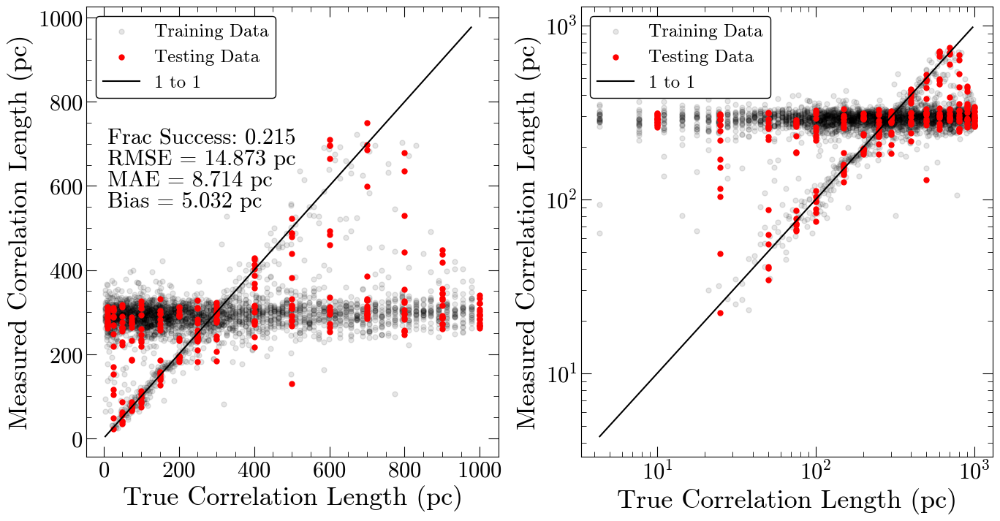

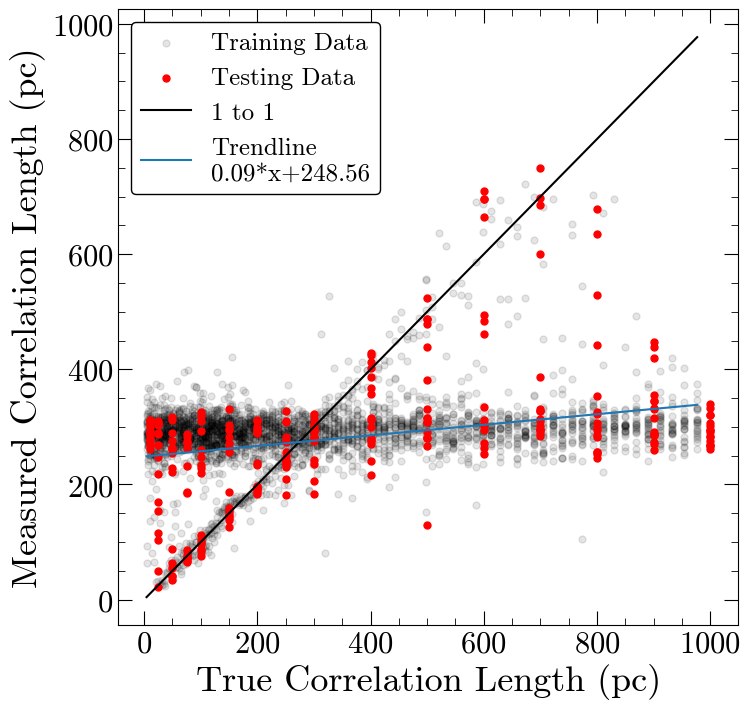

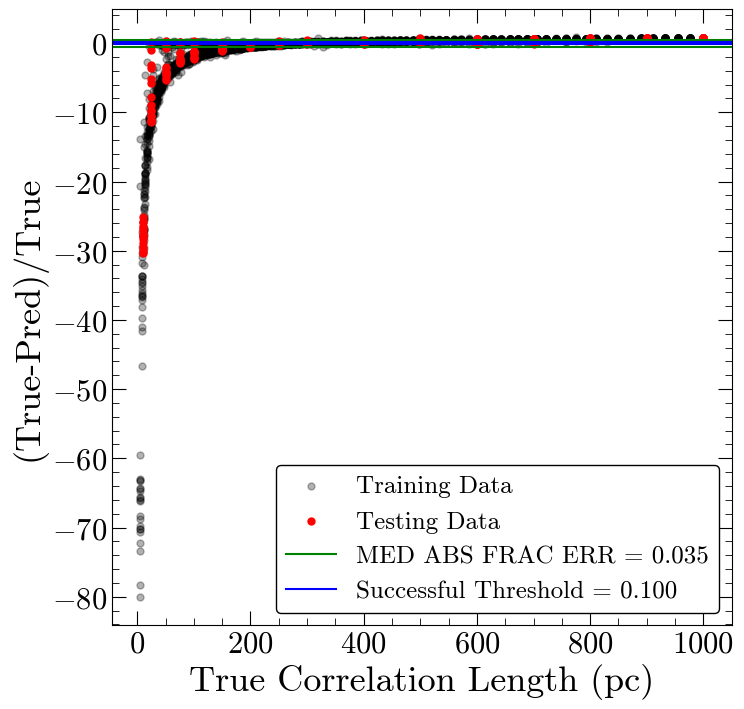

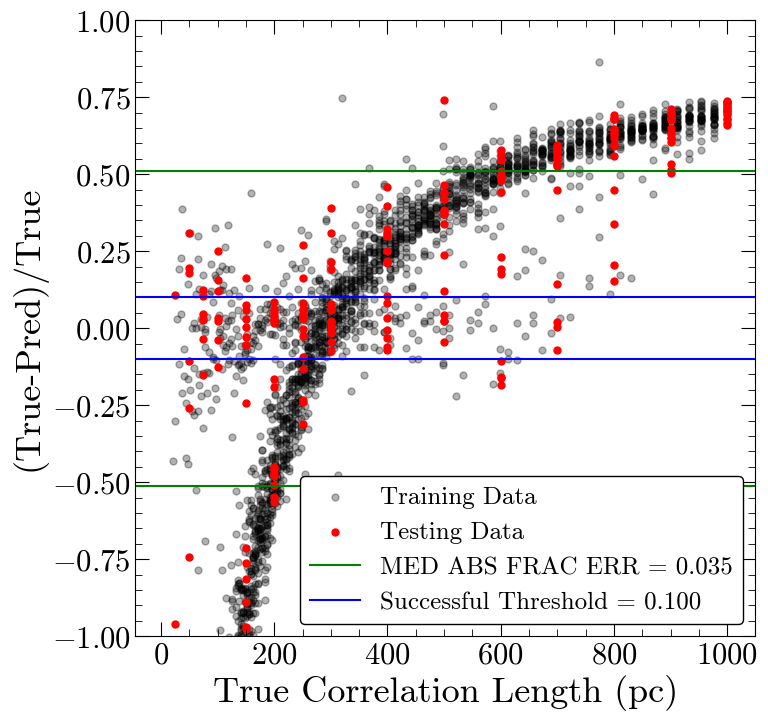

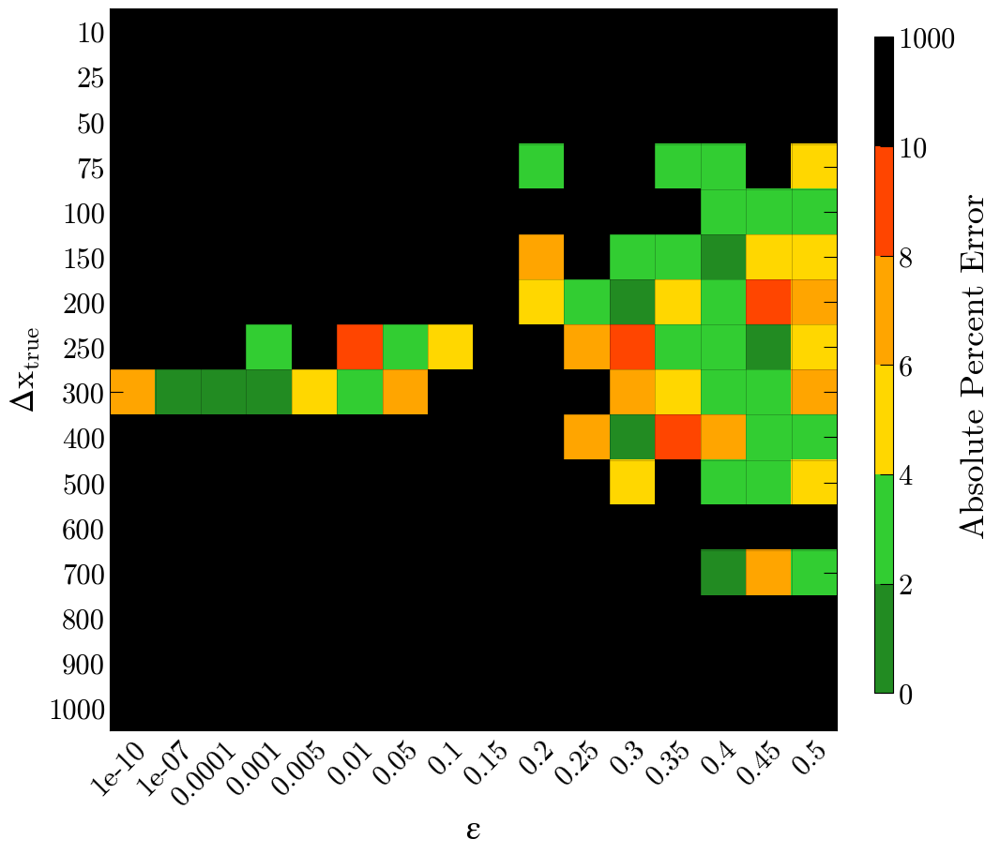

Number of squares with abs percent err>10%,  201


In [35]:
#model with more layers, run for more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 2s 11ms/step - loss: 102134.9297
Epoch 2/100
92/92 [==============================] - 1s 11ms/step - loss: 67849.7031
Epoch 3/100
92/92 [==============================] - 1s 12ms/step - loss: 68025.3203
Epoch 4/100
92/92 [==============================] - 1s 8ms/step - loss: 67572.9922
Epoch 5/100
92/92 [==============================] - 1s 10ms/step - loss: 68124.3828
Epoch 6/100
92/92 [==============================] - 1s 10ms/step - loss: 67561.3516
Epoch 7/100
92/92 [==============================] - 1s 10ms/step - loss: 67489.7344
Epoch 8/100
92/92 [==============================] - 1s 9ms/step - loss: 67619.3047
Epoch 9/100
92/92 [==============================] - 1s 12ms/step - loss: 67177.6016
Epoch 10/100
92/92 [==============================] - 1s 10ms/step - loss: 67271.9062
Epoch 11/100
92/92 [==============================] - 1s 9ms/step - loss: 67484.1641
Epoch 12/100
92/92 [==============================] - 1s 9ms/step

Epoch 97/100
92/92 [==============================] - 1s 13ms/step - loss: 63191.2188
Epoch 98/100
92/92 [==============================] - 1s 8ms/step - loss: 63420.1328
Epoch 99/100
92/92 [==============================] - 1s 7ms/step - loss: 63401.7266
Epoch 100/100
92/92 [==============================] - 1s 8ms/step - loss: 63541.6250

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 250.451 pc
MAE: 184.527 pc
BIAS: -46.865 pc
MED FRAC ERR: 0.581 

Training Stats, Successful Fits
Frac Success Fit: 0.116 
RMSE: 17.537 pc
MAE: 11.452 pc
BIAS: -0.615 pc
MED FRAC ERR: 0.042 

Testing Stats
RMSE: 299.684 pc
MAE: 196.937 pc
BIAS: 1.897 pc
MED FRAC ERR: 0.511 

Testing Stats, Successful Fits
Frac Success Fit: 0.203 
RMSE: 16.122 pc
MAE: 6.834 pc
BIAS: 0.296 pc
MED FRAC ERR: 0.033 


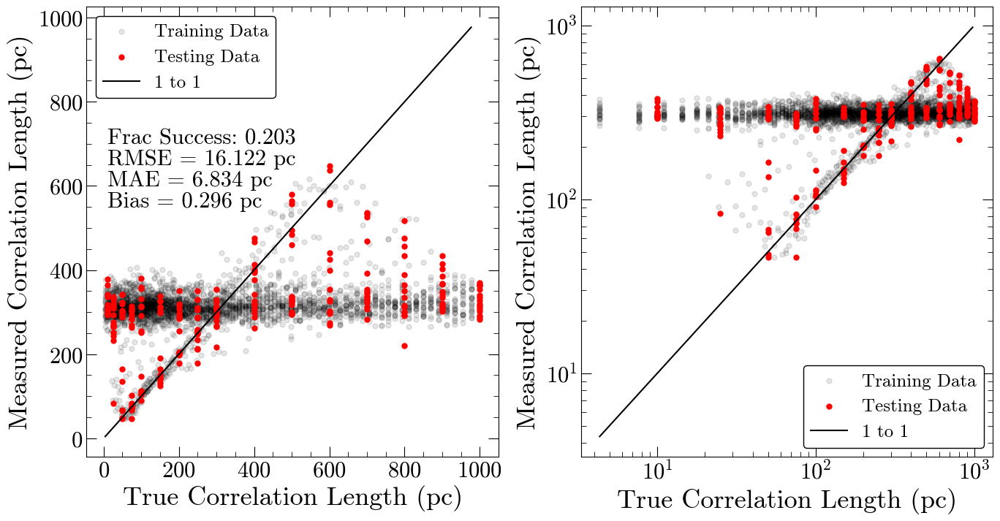

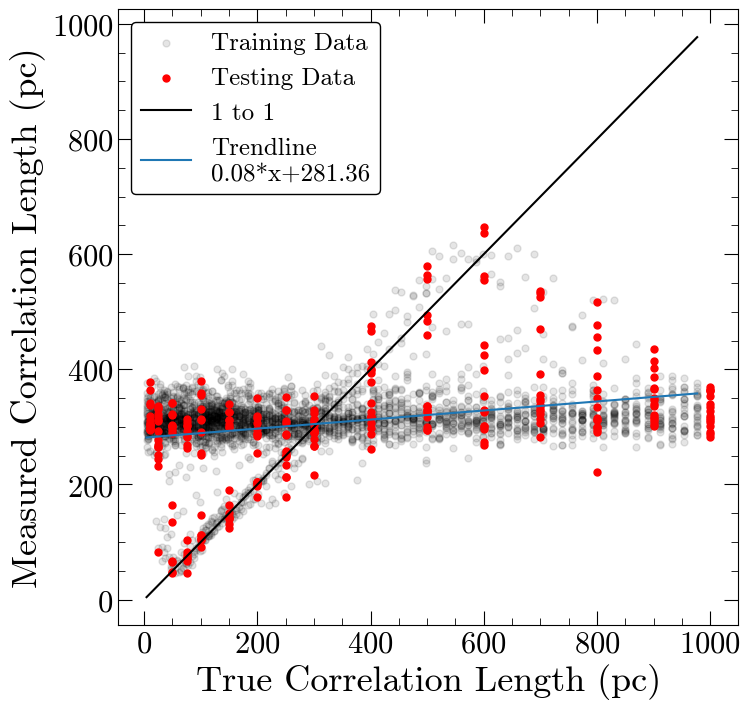

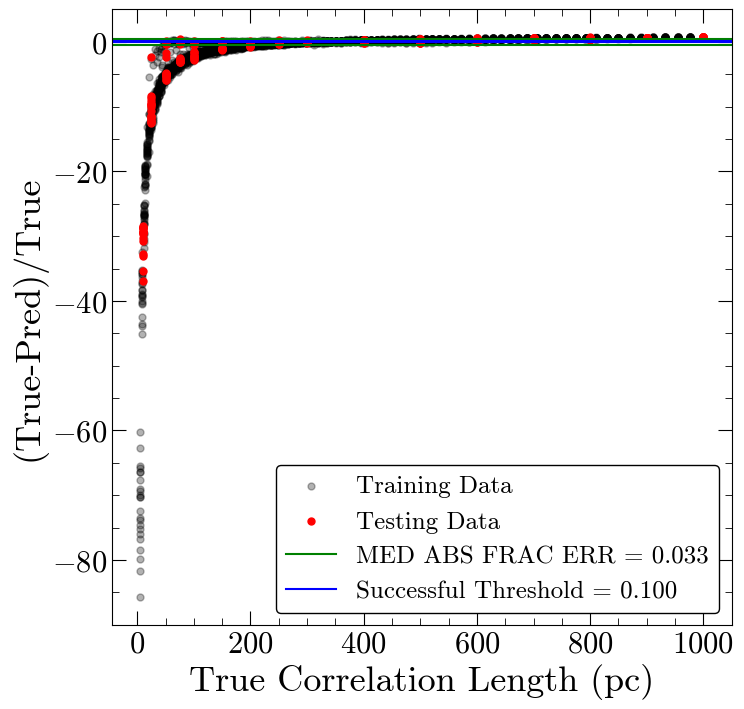

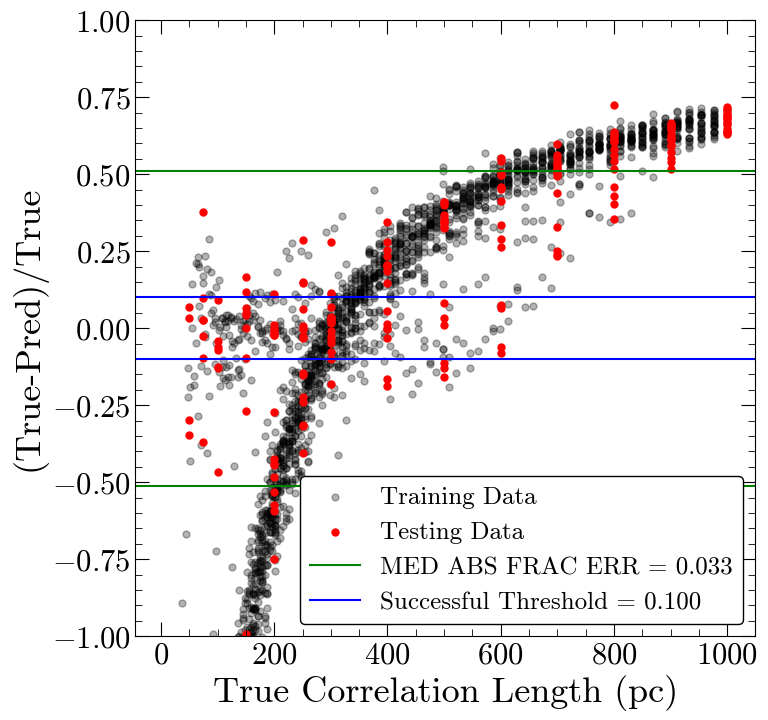

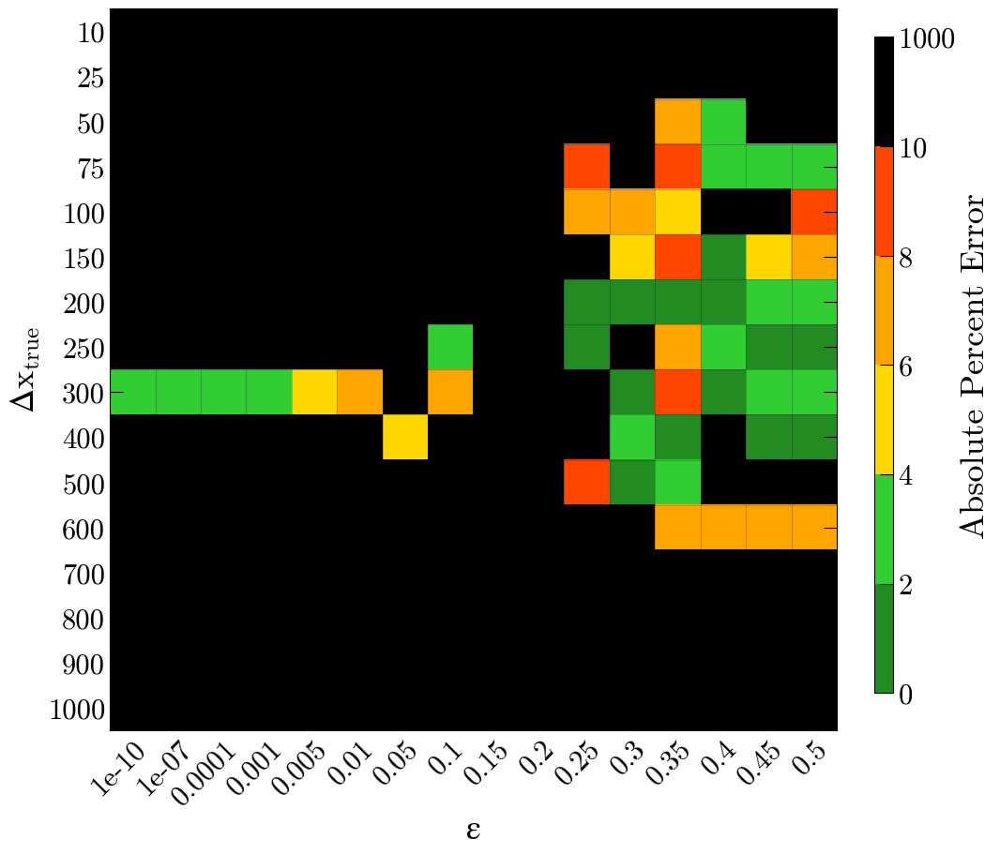

Number of squares with abs percent err>10%,  204


In [36]:
#model with more layers, increase max pooling in first layer
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/100
92/92 [==============================] - 1s 10ms/step - loss: 98273.1406
Epoch 2/100
92/92 [==============================] - 1s 8ms/step - loss: 68077.6719
Epoch 3/100
92/92 [==============================] - 1s 7ms/step - loss: 67885.1484
Epoch 4/100
92/92 [==============================] - 1s 9ms/step - loss: 67909.8906
Epoch 5/100
92/92 [==============================] - 1s 8ms/step - loss: 68037.2344
Epoch 6/100
92/92 [==============================] - 1s 8ms/step - loss: 67394.6875
Epoch 7/100
92/92 [==============================] - 1s 9ms/step - loss: 67543.4375
Epoch 8/100
92/92 [==============================] - 1s 8ms/step - loss: 67347.2969
Epoch 9/100
92/92 [==============================] - 1s 7ms/step - loss: 67014.0312
Epoch 10/100
92/92 [==============================] - 1s 6ms/step - loss: 66733.1328
Epoch 11/100
92/92 [==============================] - 1s 6ms/step - loss: 67324.1406
Epoch 12/100
92/92 [==============================] - 1s 8ms/step - loss:

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 250.855 pc
MAE: 171.308 pc
BIAS: -29.816 pc
MED FRAC ERR: 0.581 

Training Stats, Successful Fits
Frac Success Fit: 0.117 
RMSE: 16.645 pc
MAE: 11.792 pc
BIAS: 1.134 pc
MED FRAC ERR: 0.046 

Testing Stats
RMSE: 306.446 pc
MAE: 191.007 pc
BIAS: 7.210 pc
MED FRAC ERR: 0.534 

Testing Stats, Successful Fits
Frac Success Fit: 0.203 
RMSE: 18.224 pc
MAE: 8.535 pc
BIAS: 2.329 pc
MED FRAC ERR: 0.042 


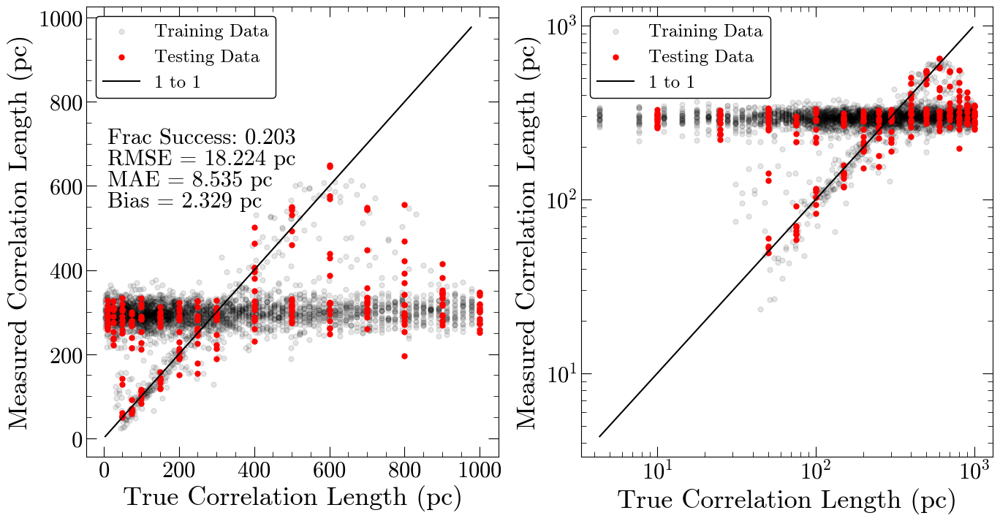

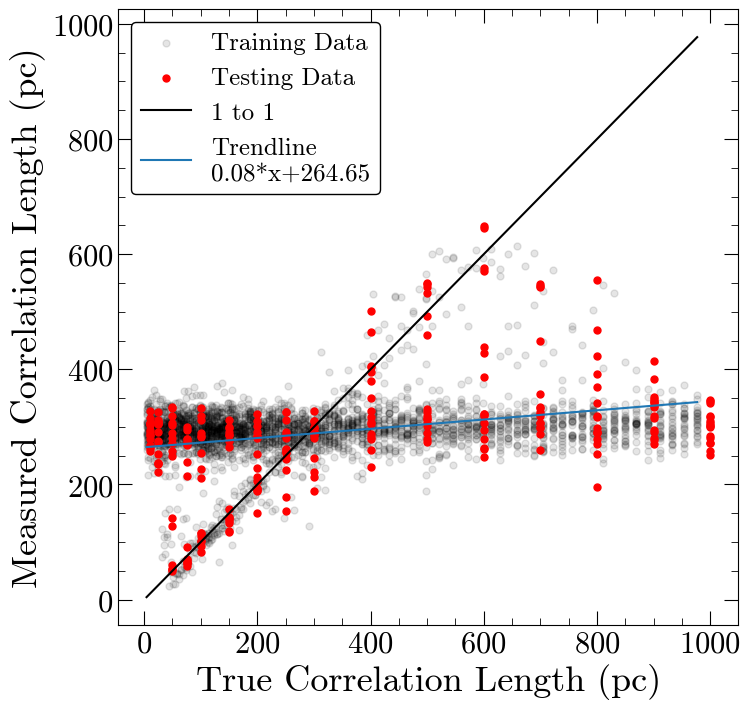

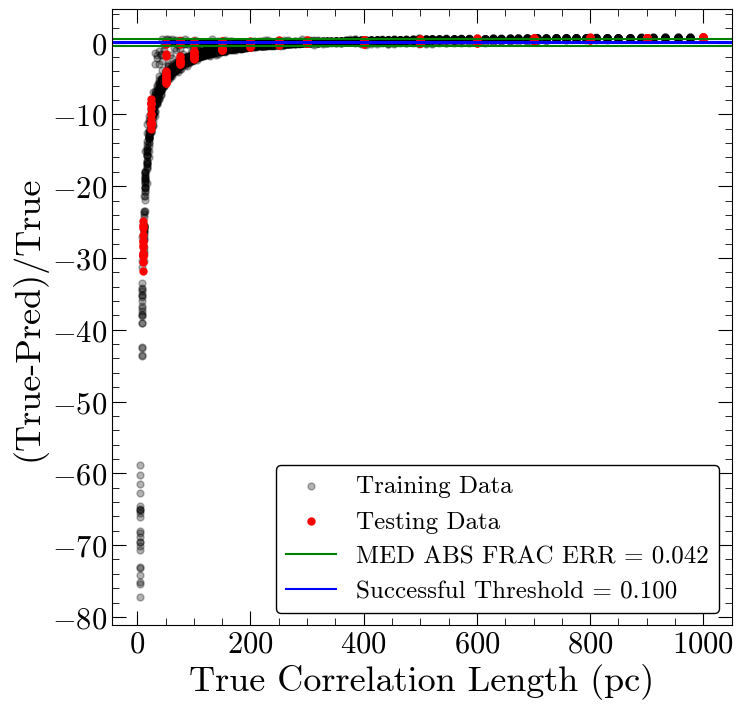

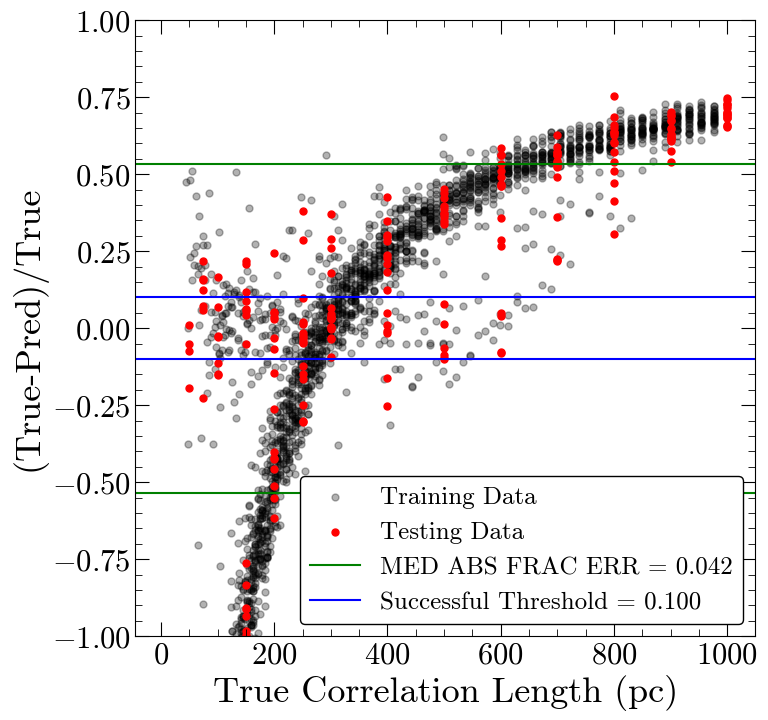

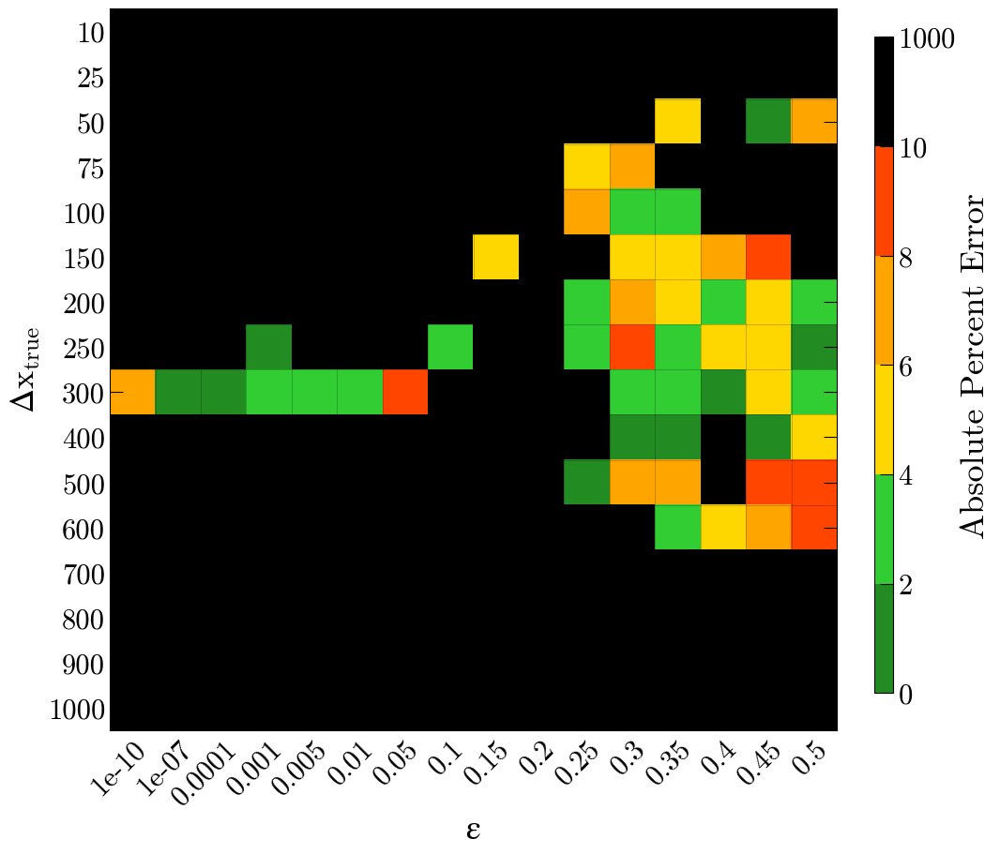

Number of squares with abs percent err>10%,  204


In [37]:
#model with more layers, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=100, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/200
92/92 [==============================] - 1s 8ms/step - loss: 101770.8906
Epoch 2/200
92/92 [==============================] - 1s 8ms/step - loss: 67980.6172
Epoch 3/200
92/92 [==============================] - 1s 7ms/step - loss: 67581.4844
Epoch 4/200
92/92 [==============================] - 1s 7ms/step - loss: 67578.9141
Epoch 5/200
92/92 [==============================] - 1s 8ms/step - loss: 67977.2656
Epoch 6/200
92/92 [==============================] - 1s 8ms/step - loss: 67910.0000
Epoch 7/200
92/92 [==============================] - 1s 8ms/step - loss: 67403.3672
Epoch 8/200
92/92 [==============================] - 1s 7ms/step - loss: 67052.1875
Epoch 9/200
92/92 [==============================] - 1s 6ms/step - loss: 67174.7031
Epoch 10/200
92/92 [==============================] - 0s 5ms/step - loss: 66914.5938
Epoch 11/200
92/92 [==============================] - 1s 6ms/step - loss: 66788.8359
Epoch 12/200
92/92 [==============================] - 1s 6ms/step - loss:

92/92 [==============================] - 1s 8ms/step - loss: 62156.3672
Epoch 193/200
92/92 [==============================] - 1s 7ms/step - loss: 62091.1914
Epoch 194/200
92/92 [==============================] - 1s 7ms/step - loss: 61700.1914
Epoch 195/200
92/92 [==============================] - 1s 8ms/step - loss: 61604.0352
Epoch 196/200
92/92 [==============================] - 1s 7ms/step - loss: 61618.2070
Epoch 197/200
92/92 [==============================] - 1s 7ms/step - loss: 61694.7617
Epoch 198/200
92/92 [==============================] - 1s 7ms/step - loss: 61794.4258
Epoch 199/200
92/92 [==============================] - 1s 9ms/step - loss: 61904.7188
Epoch 200/200
92/92 [==============================] - 1s 8ms/step - loss: 61783.2617

Showing the 0 curves that returned NaNs


,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 248.622 pc
MAE: 166.442 pc
BIAS: -26.675 pc
MED FRAC ERR: 0.573 

Training Stats, Successful Fits
Frac Success Fit: 0.134 
RMSE: 17.579 pc
MAE: 10.361 pc
BIAS: -0.745 pc
MED FRAC ERR: 0.043 

Testing Stats
RMSE: 298.986 pc
MAE: 152.764 pc
BIAS: 4.279 pc
MED FRAC ERR: 0.514 

Testing Stats, Successful Fits
Frac Success Fit: 0.246 
RMSE: 16.950 pc
MAE: 7.617 pc
BIAS: -0.360 pc
MED FRAC ERR: 0.033 


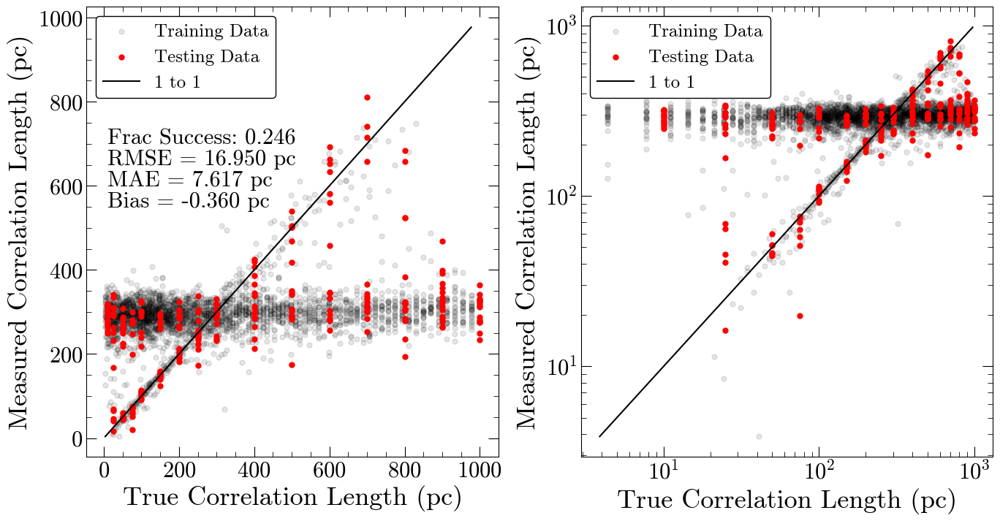

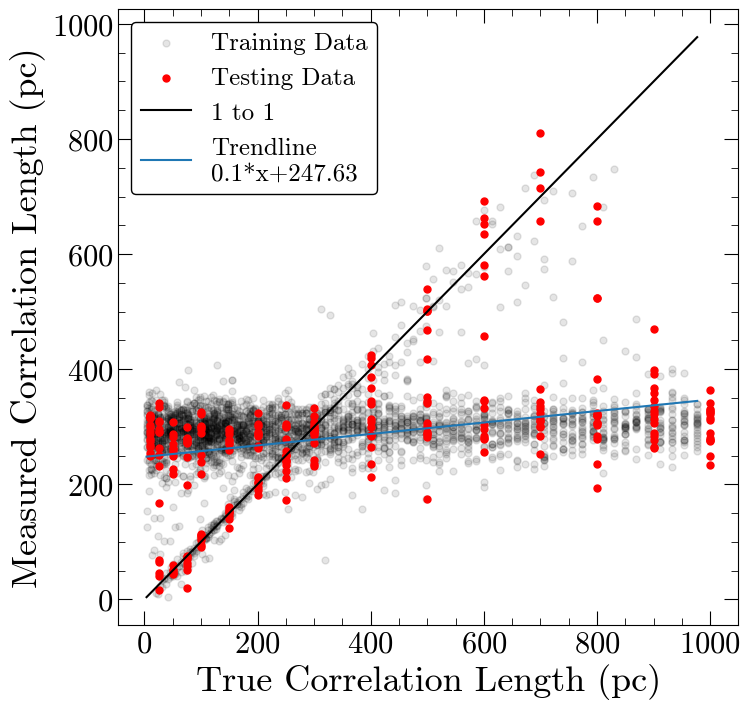

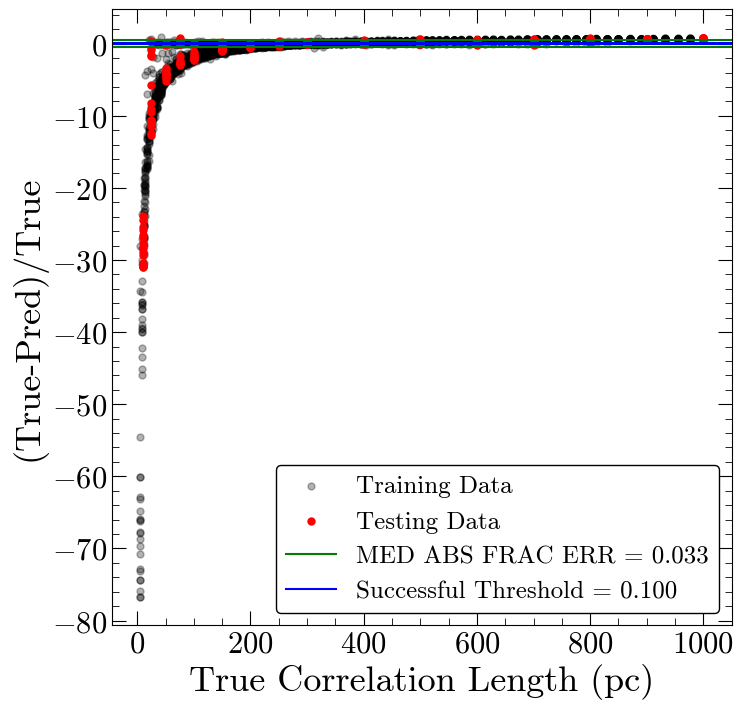

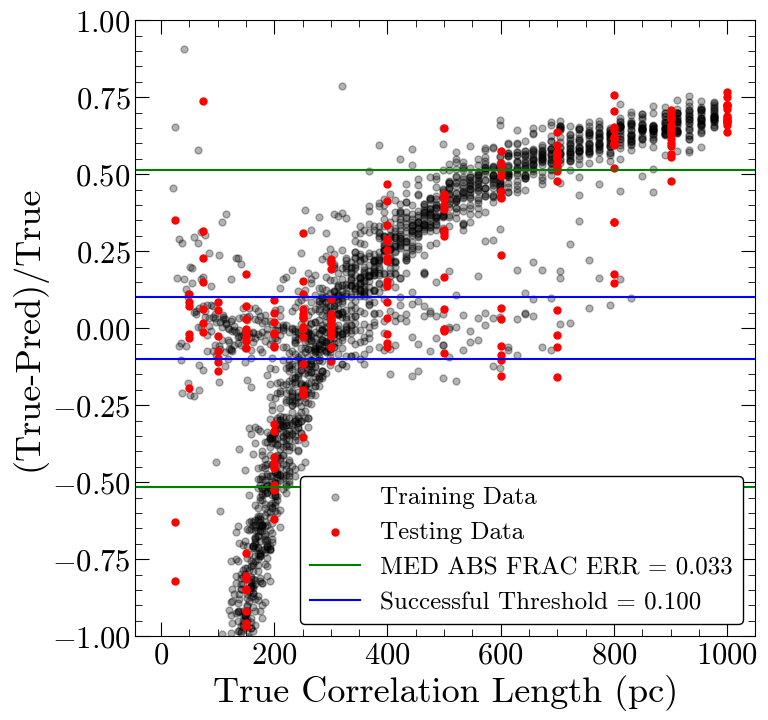

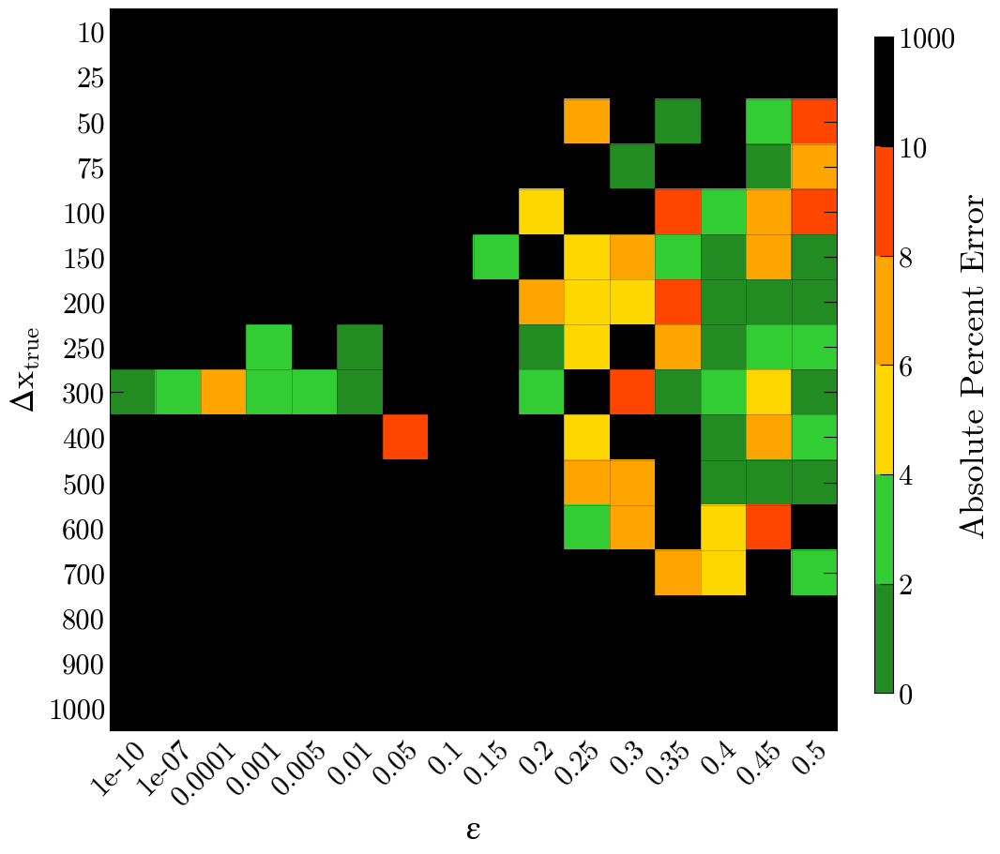

Number of squares with abs percent err>10%,  193


In [38]:
#model with more layers, run for more epochs, increase max pooling and kernel size in first layer
model = Sequential([
    Conv1D(32, 5, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(3), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=200, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 1s 9ms/step - loss: 99760.5547
Epoch 2/400
92/92 [==============================] - 1s 8ms/step - loss: 68424.6875
Epoch 3/400
92/92 [==============================] - 1s 9ms/step - loss: 68391.0469
Epoch 4/400
92/92 [==============================] - 1s 8ms/step - loss: 68321.8359
Epoch 5/400
92/92 [==============================] - 1s 10ms/step - loss: 67760.4688
Epoch 6/400
92/92 [==============================] - 1s 9ms/step - loss: 68014.8438
Epoch 7/400
92/92 [==============================] - 1s 11ms/step - loss: 67141.1406
Epoch 8/400
92/92 [==============================] - 1s 8ms/step - loss: 66944.7578
Epoch 9/400
92/92 [==============================] - 1s 8ms/step - loss: 67299.0156
Epoch 10/400
92/92 [==============================] - 1s 10ms/step - loss: 66771.6484
Epoch 11/400
92/92 [==============================] - 1s 9ms/step - loss: 66376.2578
Epoch 12/400
92/92 [==============================] - 1s 8ms/step - los

92/92 [==============================] - 1s 13ms/step - loss: 61987.5586
Epoch 191/400
92/92 [==============================] - 1s 13ms/step - loss: 61807.6875
Epoch 192/400
92/92 [==============================] - 1s 12ms/step - loss: 62128.8555
Epoch 193/400
92/92 [==============================] - 1s 10ms/step - loss: 61837.5117
Epoch 194/400
92/92 [==============================] - 1s 10ms/step - loss: 61877.5156
Epoch 195/400
92/92 [==============================] - 1s 12ms/step - loss: 62011.9727
Epoch 196/400
92/92 [==============================] - 1s 13ms/step - loss: 62189.8242
Epoch 197/400
92/92 [==============================] - 1s 11ms/step - loss: 61866.5508
Epoch 198/400
92/92 [==============================] - 1s 9ms/step - loss: 62079.8477
Epoch 199/400
92/92 [==============================] - 1s 10ms/step - loss: 62117.3672
Epoch 200/400
92/92 [==============================] - 1s 10ms/step - loss: 62268.9883
Epoch 201/400
92/92 [==============================] - 1s 

92/92 [==============================] - 1s 9ms/step - loss: 60429.6211
Epoch 379/400
92/92 [==============================] - 1s 9ms/step - loss: 60354.9844
Epoch 380/400
92/92 [==============================] - 1s 10ms/step - loss: 60386.8828
Epoch 381/400
92/92 [==============================] - 1s 9ms/step - loss: 60199.8320
Epoch 382/400
92/92 [==============================] - 1s 9ms/step - loss: 60375.3828
Epoch 383/400
92/92 [==============================] - 1s 9ms/step - loss: 60258.2891
Epoch 384/400
92/92 [==============================] - 1s 10ms/step - loss: 60258.5586
Epoch 385/400
92/92 [==============================] - 1s 10ms/step - loss: 60202.8125
Epoch 386/400
92/92 [==============================] - 1s 10ms/step - loss: 60326.6016
Epoch 387/400
92/92 [==============================] - 1s 10ms/step - loss: 60489.9258
Epoch 388/400
92/92 [==============================] - 1s 10ms/step - loss: 59876.3164
Epoch 389/400
92/92 [==============================] - 1s 12ms

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 244.095 pc
MAE: 181.192 pc
BIAS: -54.759 pc
MED FRAC ERR: 0.563 

Training Stats, Successful Fits
Frac Success Fit: 0.137 
RMSE: 18.632 pc
MAE: 11.555 pc
BIAS: -0.891 pc
MED FRAC ERR: 0.042 

Testing Stats
RMSE: 286.923 pc
MAE: 176.589 pc
BIAS: -0.338 pc
MED FRAC ERR: 0.482 

Testing Stats, Successful Fits
Frac Success Fit: 0.203 
RMSE: 24.000 pc
MAE: 10.471 pc
BIAS: 0.106 pc
MED FRAC ERR: 0.047 


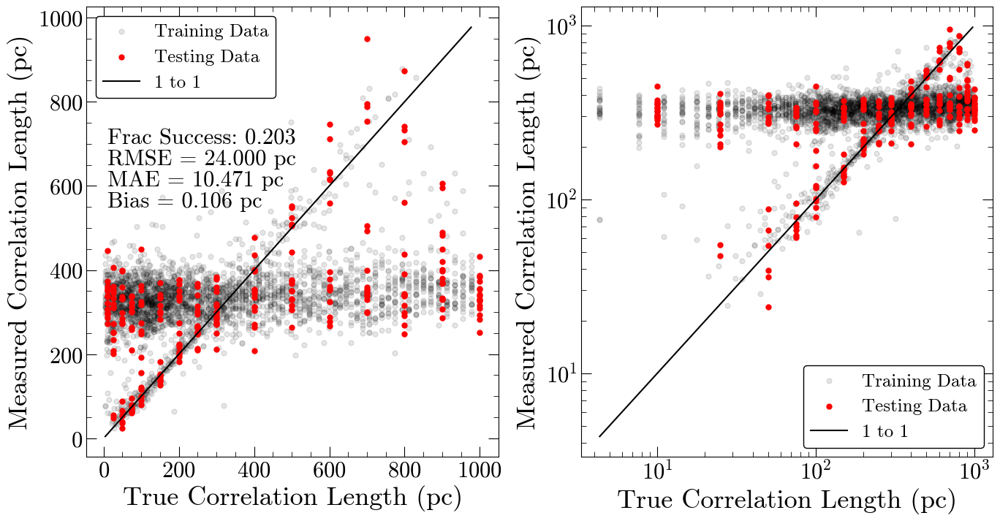

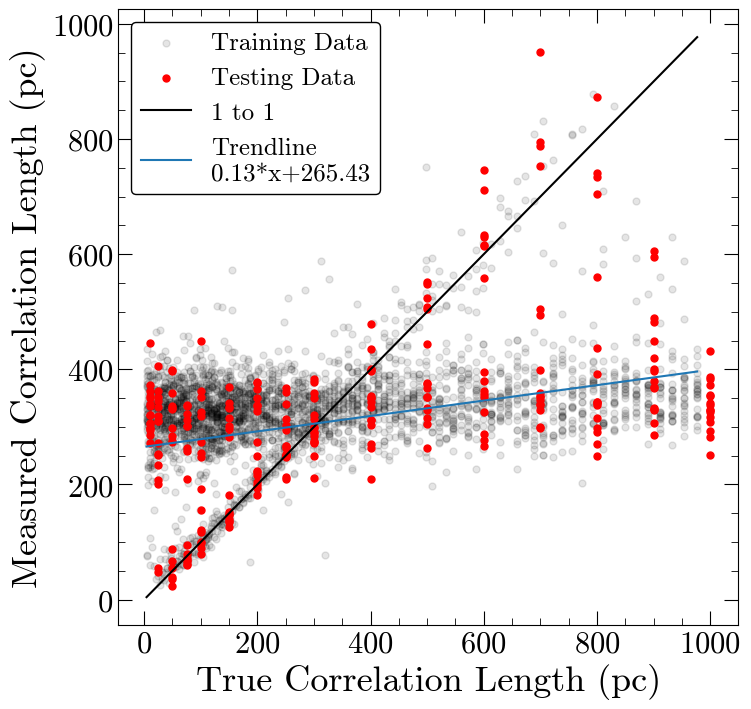

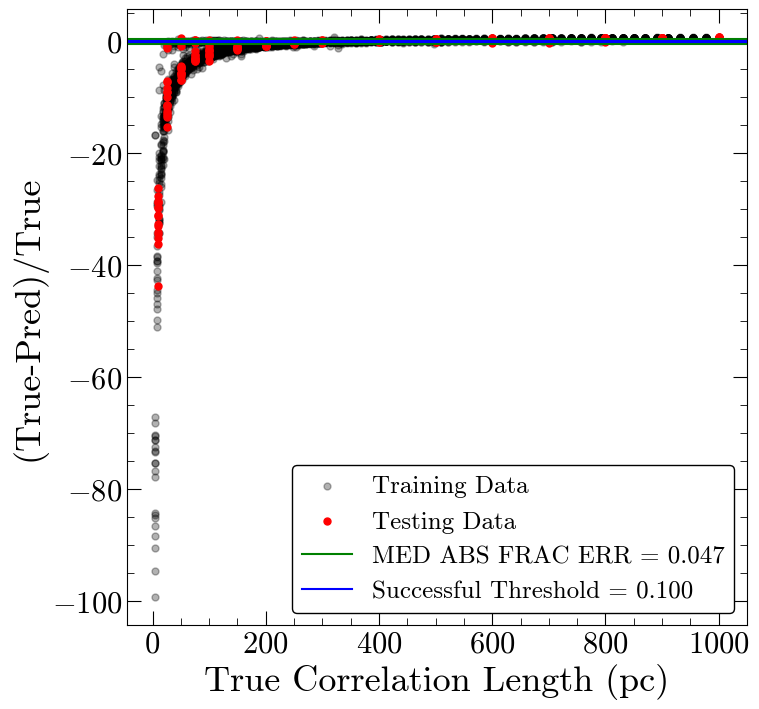

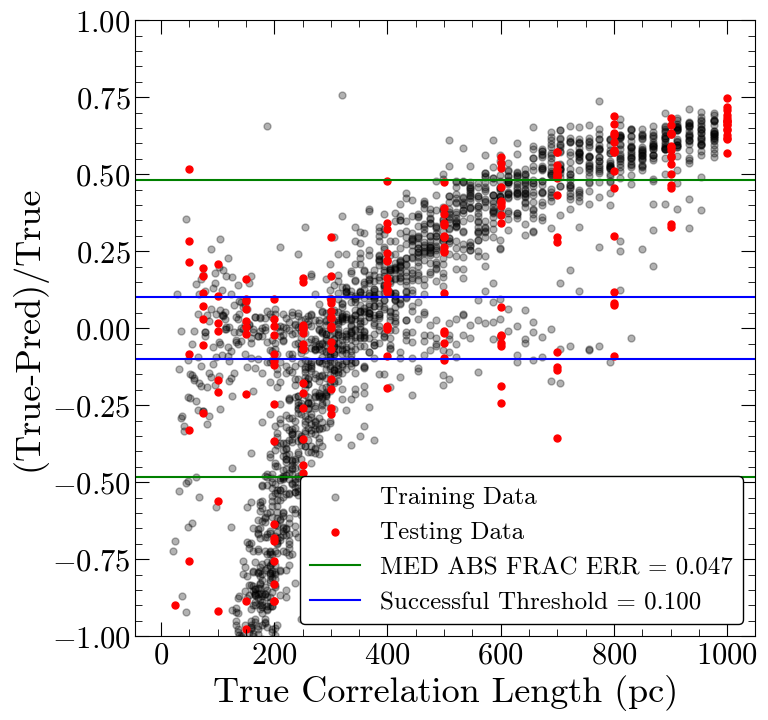

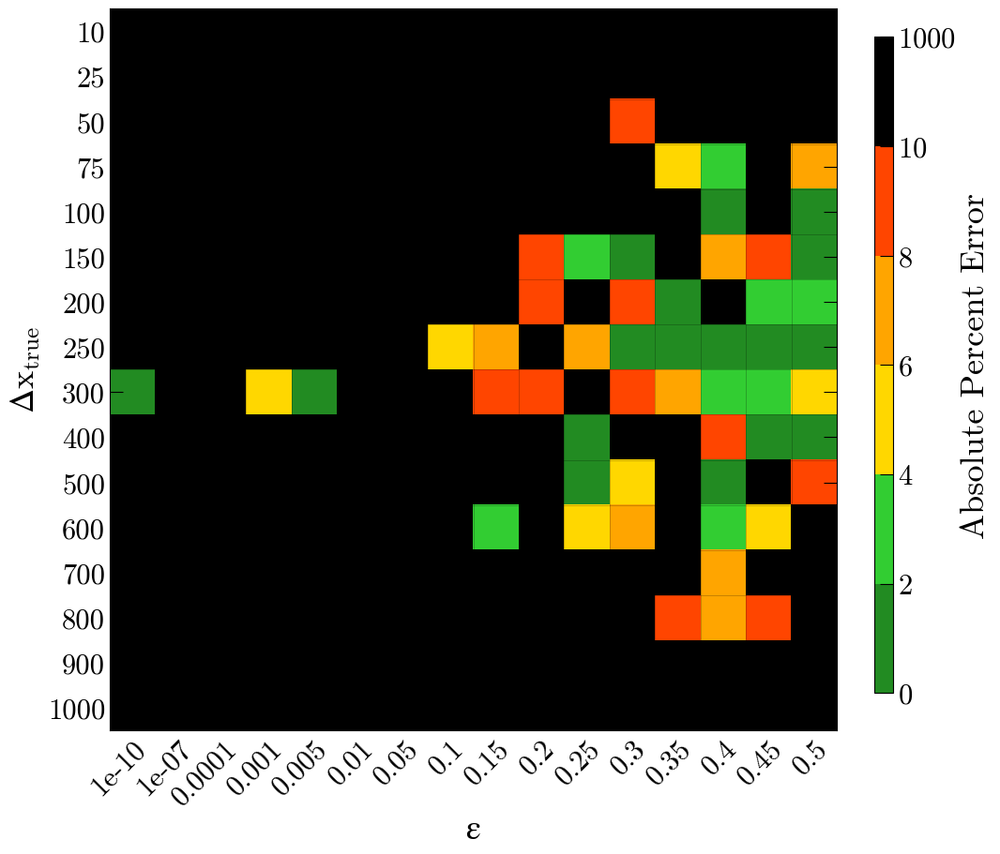

Number of squares with abs percent err>10%,  204


In [39]:
#model with more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
92/92 [==============================] - 2s 10ms/step - loss: 101435.4062
Epoch 2/400
92/92 [==============================] - 1s 10ms/step - loss: 68272.7188
Epoch 3/400
92/92 [==============================] - 1s 10ms/step - loss: 67943.5859
Epoch 4/400
92/92 [==============================] - 1s 9ms/step - loss: 68008.9531
Epoch 5/400
92/92 [==============================] - 1s 9ms/step - loss: 67686.5703
Epoch 6/400
92/92 [==============================] - 1s 10ms/step - loss: 67566.4219
Epoch 7/400
92/92 [==============================] - 1s 9ms/step - loss: 67570.5547
Epoch 8/400
92/92 [==============================] - 1s 10ms/step - loss: 67446.6719
Epoch 9/400
92/92 [==============================] - 1s 10ms/step - loss: 68035.5312
Epoch 10/400
92/92 [==============================] - 1s 11ms/step - loss: 66793.5312
Epoch 11/400
92/92 [==============================] - 1s 9ms/step - loss: 66833.7500
Epoch 12/400
92/92 [==============================] - 1s 9ms/step 

92/92 [==============================] - 1s 10ms/step - loss: 62896.7578
Epoch 98/400
92/92 [==============================] - 1s 8ms/step - loss: 62775.6680
Epoch 99/400
92/92 [==============================] - 1s 9ms/step - loss: 63022.0117
Epoch 100/400
92/92 [==============================] - 1s 10ms/step - loss: 62792.4961
Epoch 101/400
92/92 [==============================] - 1s 9ms/step - loss: 62847.2891
Epoch 102/400
92/92 [==============================] - 1s 9ms/step - loss: 62486.0352
Epoch 103/400
92/92 [==============================] - 1s 10ms/step - loss: 62587.9727
Epoch 104/400
92/92 [==============================] - 1s 10ms/step - loss: 62517.9805
Epoch 105/400
92/92 [==============================] - 1s 10ms/step - loss: 63406.6094
Epoch 106/400
92/92 [==============================] - 1s 9ms/step - loss: 62457.3516
Epoch 107/400
92/92 [==============================] - 1s 9ms/step - loss: 62670.5273
Epoch 108/400
92/92 [==============================] - 1s 10ms/st

92/92 [==============================] - 1s 10ms/step - loss: 62165.9805
Epoch 193/400
92/92 [==============================] - 1s 9ms/step - loss: 61641.3789
Epoch 194/400
92/92 [==============================] - 1s 9ms/step - loss: 61715.1719
Epoch 195/400
92/92 [==============================] - 1s 9ms/step - loss: 62157.4805
Epoch 196/400
92/92 [==============================] - 1s 11ms/step - loss: 61890.1914
Epoch 197/400
92/92 [==============================] - 1s 10ms/step - loss: 61949.2461
Epoch 198/400
92/92 [==============================] - 1s 9ms/step - loss: 61739.2852
Epoch 199/400
92/92 [==============================] - 1s 8ms/step - loss: 61684.3203
Epoch 200/400
92/92 [==============================] - 1s 10ms/step - loss: 61930.0117
Epoch 201/400
92/92 [==============================] - 1s 8ms/step - loss: 61702.2188
Epoch 202/400
92/92 [==============================] - 1s 9ms/step - loss: 61668.8320
Epoch 203/400
92/92 [==============================] - 1s 11ms/s

92/92 [==============================] - 1s 8ms/step - loss: 59408.8711
Epoch 381/400
92/92 [==============================] - 1s 9ms/step - loss: 59724.9727
Epoch 382/400
92/92 [==============================] - 1s 14ms/step - loss: 59755.7227
Epoch 383/400
92/92 [==============================] - 1s 8ms/step - loss: 59633.1875
Epoch 384/400
92/92 [==============================] - 1s 9ms/step - loss: 59930.7539
Epoch 385/400
92/92 [==============================] - 1s 9ms/step - loss: 59512.4062
Epoch 386/400
92/92 [==============================] - 1s 9ms/step - loss: 59970.2188
Epoch 387/400
92/92 [==============================] - 1s 10ms/step - loss: 59758.1211
Epoch 388/400
92/92 [==============================] - 1s 9ms/step - loss: 59398.5000
Epoch 389/400
92/92 [==============================] - 1s 9ms/step - loss: 59666.8008
Epoch 390/400
92/92 [==============================] - 1s 8ms/step - loss: 59403.0938
Epoch 391/400
92/92 [==============================] - 1s 9ms/step

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 242.584 pc
MAE: 162.964 pc
BIAS: -22.765 pc
MED FRAC ERR: 0.549 

Training Stats, Successful Fits
Frac Success Fit: 0.144 
RMSE: 16.211 pc
MAE: 8.967 pc
BIAS: -1.302 pc
MED FRAC ERR: 0.038 

Testing Stats
RMSE: 299.746 pc
MAE: 166.614 pc
BIAS: -1.847 pc
MED FRAC ERR: 0.504 

Testing Stats, Successful Fits
Frac Success Fit: 0.223 
RMSE: 15.919 pc
MAE: 8.145 pc
BIAS: -3.408 pc
MED FRAC ERR: 0.037 


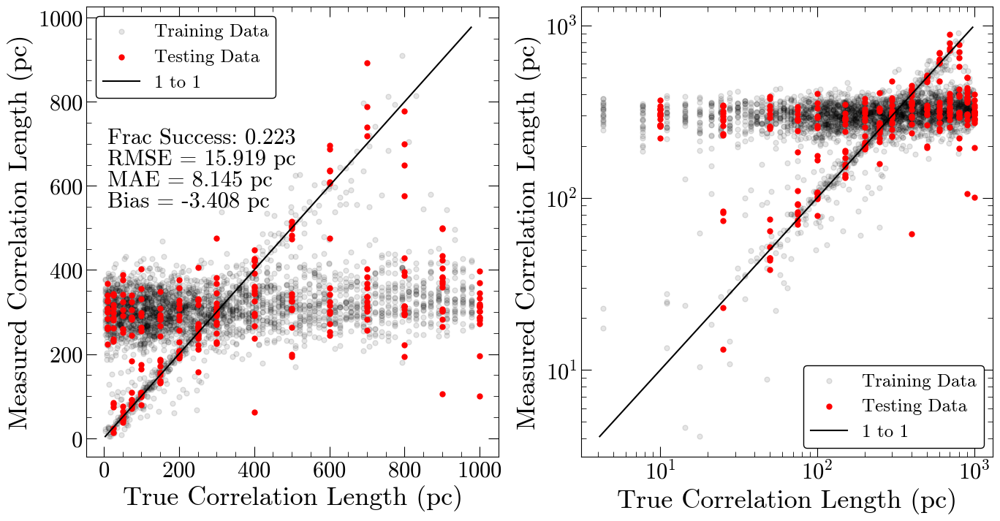

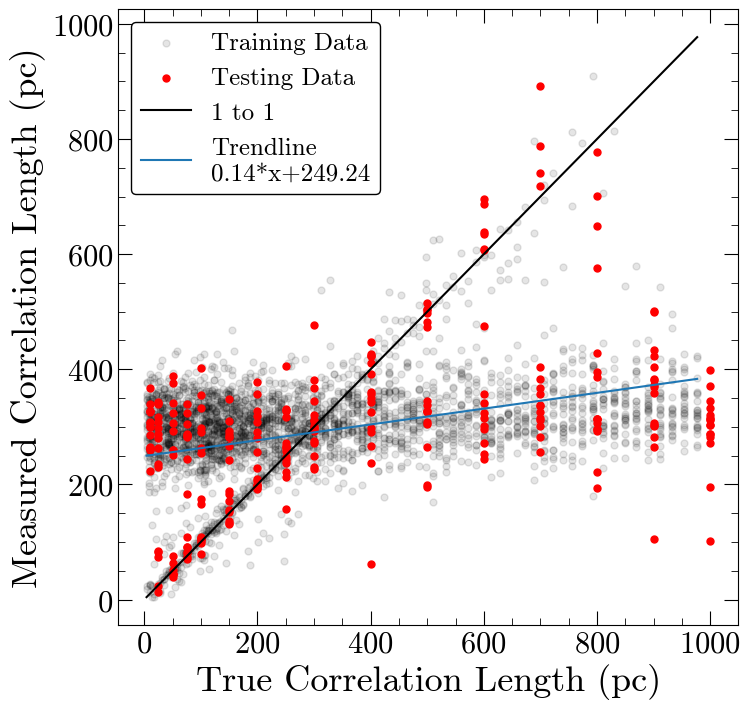

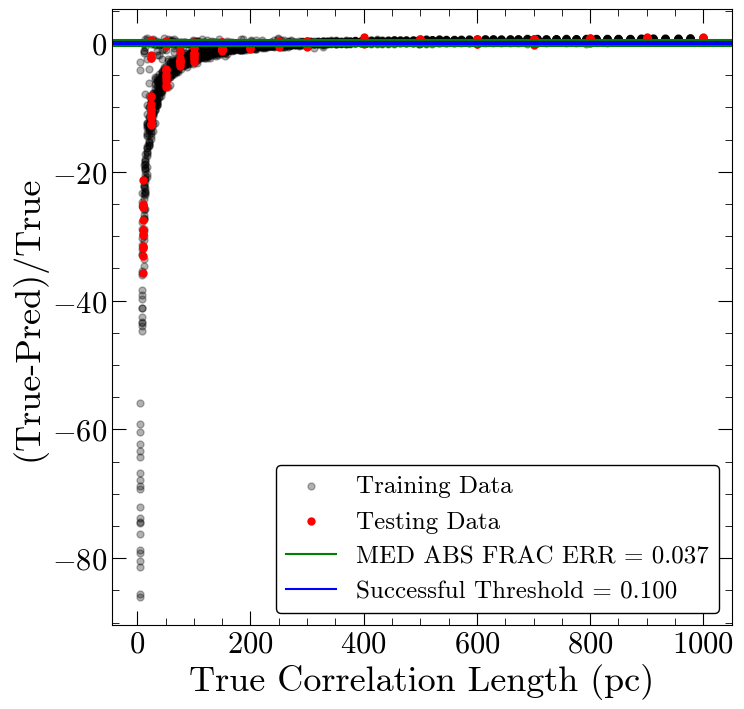

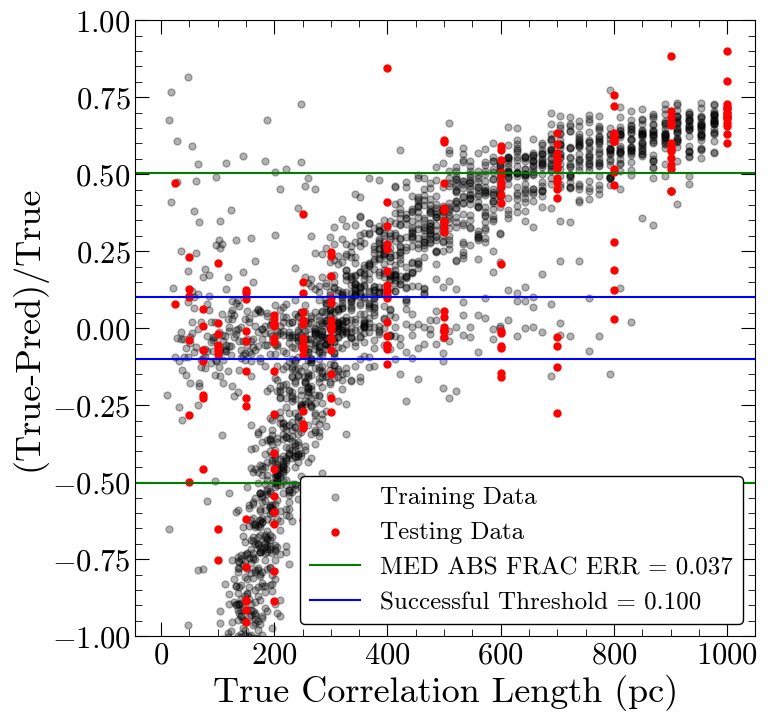

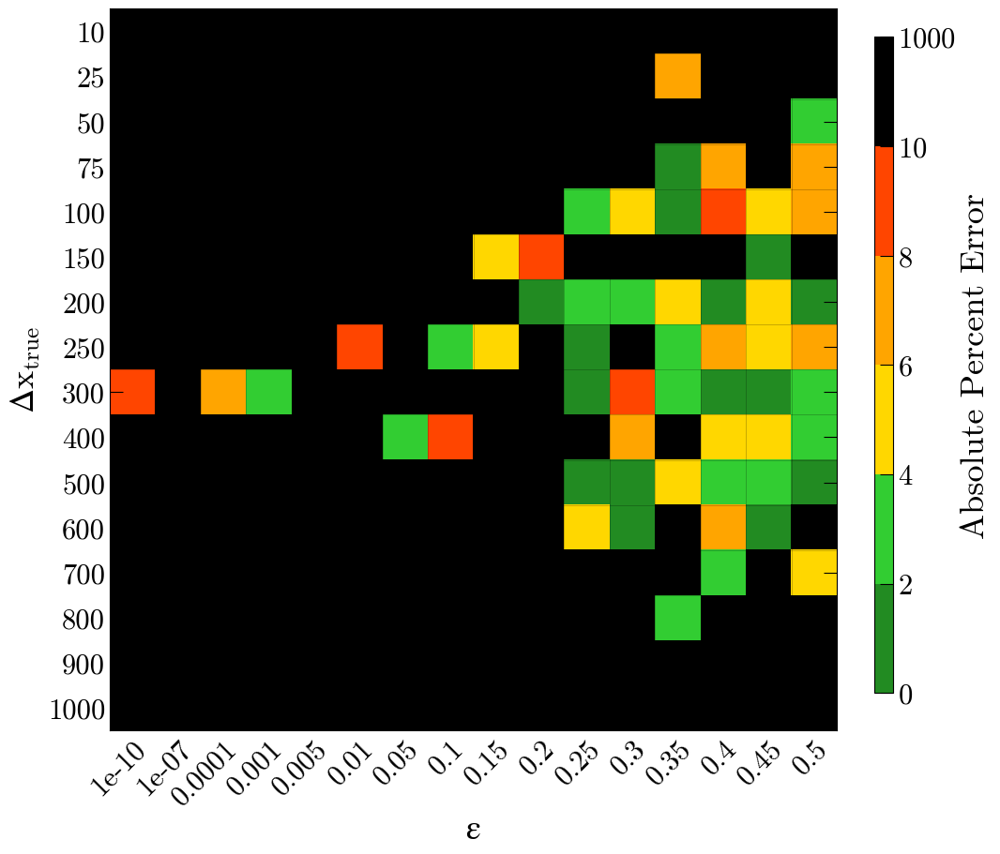

Number of squares with abs percent err>10%,  199


In [40]:
#model with even more layers, run for even more epochs
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=32)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
46/46 [==============================] - 1s 19ms/step - loss: 127548.6719
Epoch 2/400
46/46 [==============================] - 1s 13ms/step - loss: 68929.2500
Epoch 3/400
46/46 [==============================] - 0s 11ms/step - loss: 67588.7344
Epoch 4/400
46/46 [==============================] - 1s 12ms/step - loss: 67615.3672
Epoch 5/400
46/46 [==============================] - 1s 11ms/step - loss: 67898.4609
Epoch 6/400
46/46 [==============================] - 1s 11ms/step - loss: 67845.1406
Epoch 7/400
46/46 [==============================] - 1s 11ms/step - loss: 67467.7969
Epoch 8/400
46/46 [==============================] - 0s 11ms/step - loss: 67666.0312
Epoch 9/400
46/46 [==============================] - 1s 14ms/step - loss: 67361.2734
Epoch 10/400
46/46 [==============================] - 1s 13ms/step - loss: 67385.2109
Epoch 11/400
46/46 [==============================] - 1s 15ms/step - loss: 67198.8516
Epoch 12/400
46/46 [==============================] - 1s 13ms/

46/46 [==============================] - 0s 10ms/step - loss: 62498.7812
Epoch 191/400
46/46 [==============================] - 0s 9ms/step - loss: 61968.8203
Epoch 192/400
46/46 [==============================] - 1s 12ms/step - loss: 61524.0273
Epoch 193/400
46/46 [==============================] - 0s 10ms/step - loss: 61737.8594
Epoch 194/400
46/46 [==============================] - 0s 10ms/step - loss: 63106.7891
Epoch 195/400
46/46 [==============================] - 1s 11ms/step - loss: 61921.7695
Epoch 196/400
46/46 [==============================] - 1s 11ms/step - loss: 61838.7383
Epoch 197/400
46/46 [==============================] - 1s 12ms/step - loss: 61933.4570
Epoch 198/400
46/46 [==============================] - 1s 15ms/step - loss: 61608.6641
Epoch 199/400
46/46 [==============================] - 0s 11ms/step - loss: 62332.1562
Epoch 200/400
46/46 [==============================] - 1s 12ms/step - loss: 62127.4727
Epoch 201/400
46/46 [==============================] - 1s 

46/46 [==============================] - 1s 12ms/step - loss: 58432.0039
Epoch 379/400
46/46 [==============================] - 1s 11ms/step - loss: 59218.6914
Epoch 380/400
46/46 [==============================] - 1s 12ms/step - loss: 58496.0117
Epoch 381/400
46/46 [==============================] - 0s 10ms/step - loss: 58101.1055
Epoch 382/400
46/46 [==============================] - 1s 12ms/step - loss: 58410.1562
Epoch 383/400
46/46 [==============================] - 1s 21ms/step - loss: 58497.3516
Epoch 384/400
46/46 [==============================] - 1s 17ms/step - loss: 57638.5586
Epoch 385/400
46/46 [==============================] - 1s 16ms/step - loss: 58299.4531
Epoch 386/400
46/46 [==============================] - 1s 14ms/step - loss: 57868.0273
Epoch 387/400
46/46 [==============================] - 1s 12ms/step - loss: 57766.1914
Epoch 388/400
46/46 [==============================] - 0s 11ms/step - loss: 57953.7734
Epoch 389/400
46/46 [==============================] - 0s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 238.607 pc
MAE: 152.133 pc
BIAS: -18.961 pc
MED FRAC ERR: 0.537 

Training Stats, Successful Fits
Frac Success Fit: 0.147 
RMSE: 18.959 pc
MAE: 11.402 pc
BIAS: 5.501 pc
MED FRAC ERR: 0.048 

Testing Stats
RMSE: 298.639 pc
MAE: 148.288 pc
BIAS: 12.980 pc
MED FRAC ERR: 0.547 

Testing Stats, Successful Fits
Frac Success Fit: 0.203 
RMSE: 18.536 pc
MAE: 8.495 pc
BIAS: 6.964 pc
MED FRAC ERR: 0.045 


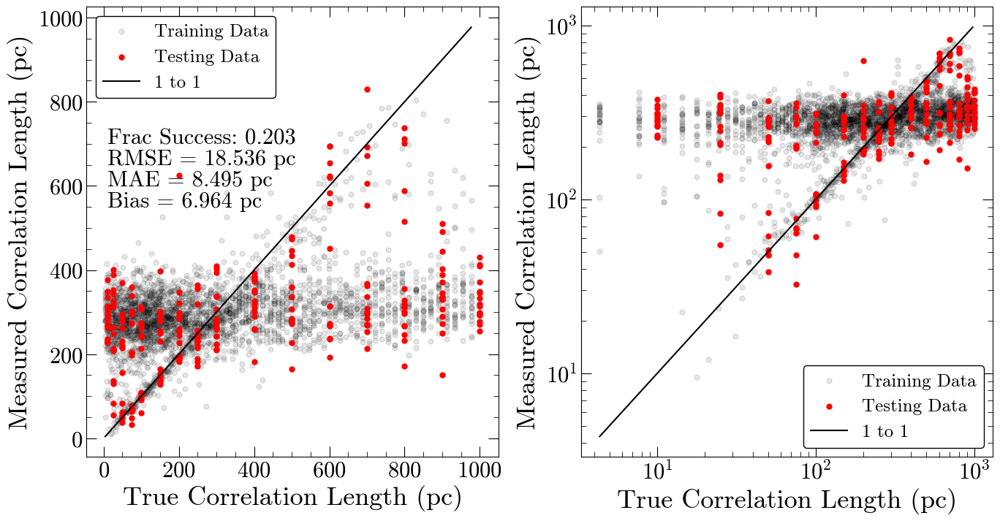

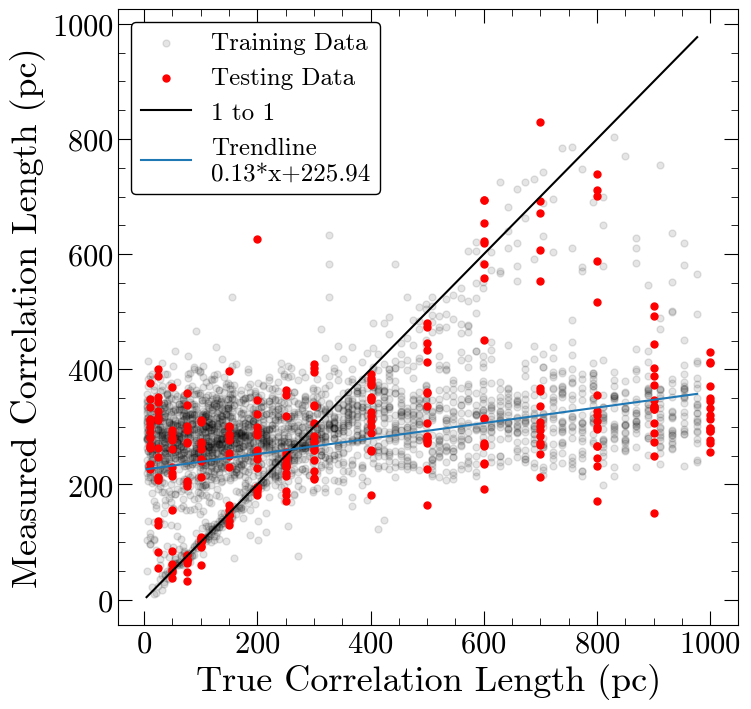

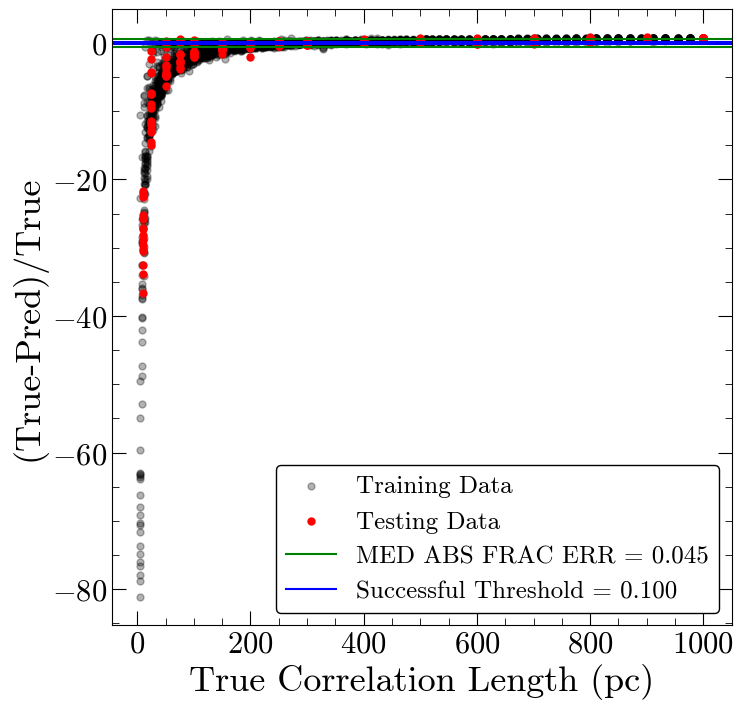

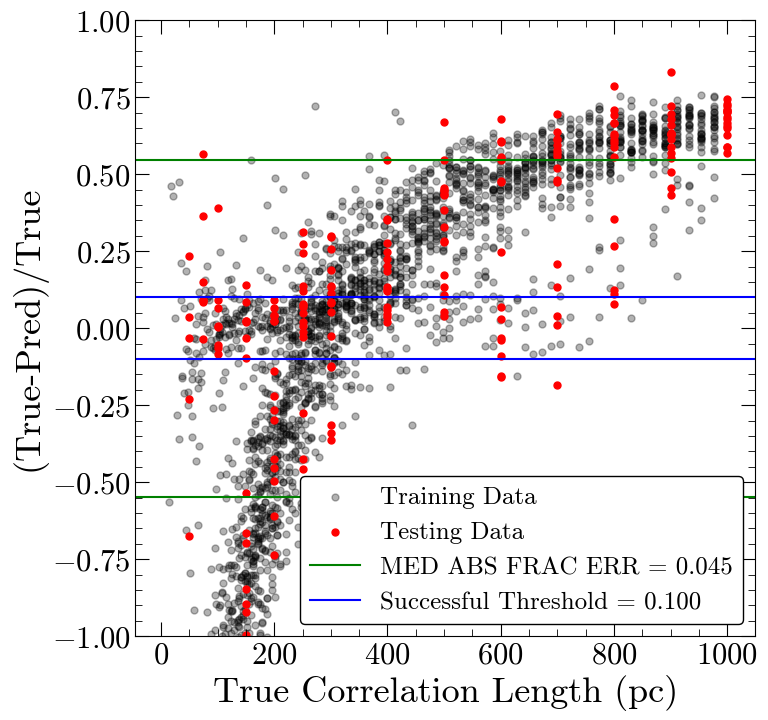

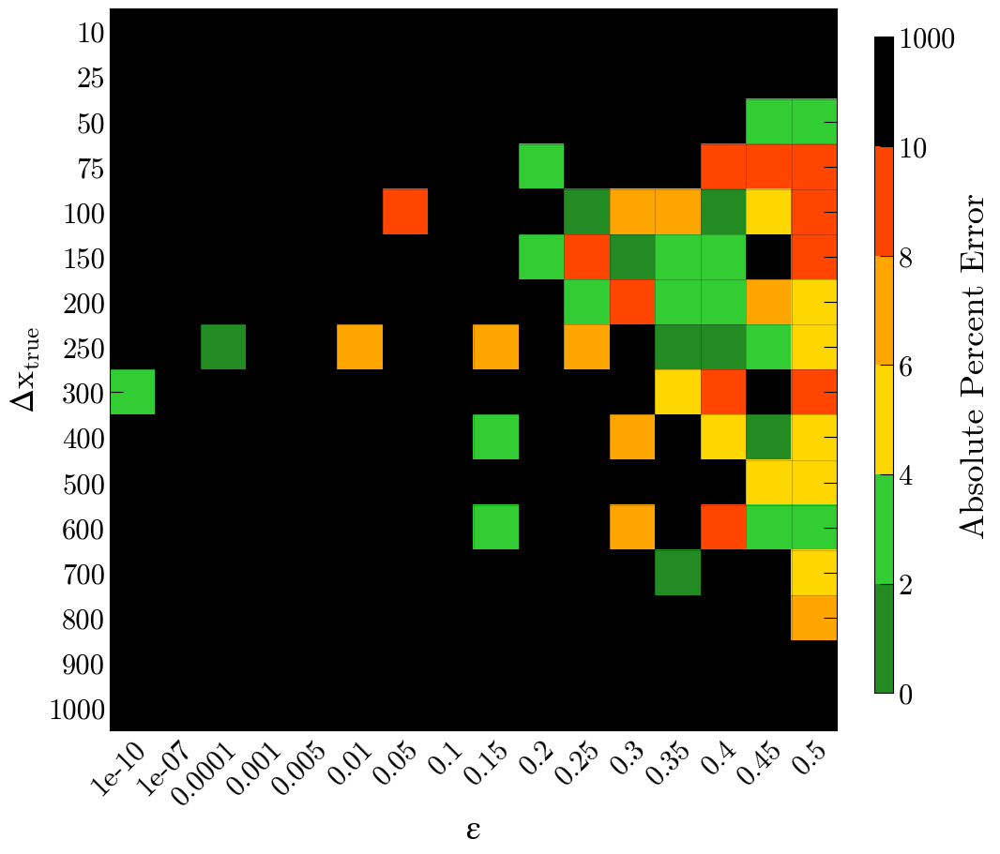

Number of squares with abs percent err>10%,  204


In [41]:
#model with even more layers, run for even more epochs, increase batch size
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=64)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

Epoch 1/400
10/10 [==============================] - 1s 29ms/step - loss: 164179.2188
Epoch 2/400
10/10 [==============================] - 0s 34ms/step - loss: 160512.2344
Epoch 3/400
10/10 [==============================] - 0s 30ms/step - loss: 131904.3281
Epoch 4/400
10/10 [==============================] - 0s 31ms/step - loss: 80259.8984
Epoch 5/400
10/10 [==============================] - 0s 34ms/step - loss: 71554.4844
Epoch 6/400
10/10 [==============================] - 0s 28ms/step - loss: 69757.2578
Epoch 7/400
10/10 [==============================] - 0s 27ms/step - loss: 68854.1328
Epoch 8/400
10/10 [==============================] - 0s 39ms/step - loss: 68210.0781
Epoch 9/400
10/10 [==============================] - 0s 34ms/step - loss: 68132.7656
Epoch 10/400
10/10 [==============================] - 0s 29ms/step - loss: 68005.5078
Epoch 11/400
10/10 [==============================] - 0s 25ms/step - loss: 67811.1328
Epoch 12/400
10/10 [==============================] - 0s 32m

10/10 [==============================] - 0s 37ms/step - loss: 62663.2969
Epoch 191/400
10/10 [==============================] - 0s 36ms/step - loss: 62636.7969
Epoch 192/400
10/10 [==============================] - 0s 36ms/step - loss: 62904.7031
Epoch 193/400
10/10 [==============================] - 0s 29ms/step - loss: 62808.8242
Epoch 194/400
10/10 [==============================] - 0s 37ms/step - loss: 63519.9219
Epoch 195/400
10/10 [==============================] - 0s 41ms/step - loss: 62751.5352
Epoch 196/400
10/10 [==============================] - 0s 32ms/step - loss: 62791.2305
Epoch 197/400
10/10 [==============================] - 0s 27ms/step - loss: 62629.3203
Epoch 198/400
10/10 [==============================] - 0s 42ms/step - loss: 62588.6758
Epoch 199/400
10/10 [==============================] - 0s 23ms/step - loss: 62721.7734
Epoch 200/400
10/10 [==============================] - 0s 41ms/step - loss: 62887.7891
Epoch 201/400
10/10 [==============================] - 0s

10/10 [==============================] - 0s 33ms/step - loss: 62030.9102
Epoch 379/400
10/10 [==============================] - 0s 30ms/step - loss: 61663.4570
Epoch 380/400
10/10 [==============================] - 0s 31ms/step - loss: 62251.3672
Epoch 381/400
10/10 [==============================] - 0s 36ms/step - loss: 61960.7734
Epoch 382/400
10/10 [==============================] - 0s 28ms/step - loss: 61734.7930
Epoch 383/400
10/10 [==============================] - 0s 39ms/step - loss: 62308.9180
Epoch 384/400
10/10 [==============================] - 0s 40ms/step - loss: 62355.8945
Epoch 385/400
10/10 [==============================] - 0s 33ms/step - loss: 62452.3008
Epoch 386/400
10/10 [==============================] - 0s 33ms/step - loss: 62244.4570
Epoch 387/400
10/10 [==============================] - 0s 35ms/step - loss: 62421.6367
Epoch 388/400
10/10 [==============================] - 0s 29ms/step - loss: 62410.9375
Epoch 389/400
10/10 [==============================] - 0s

,y_true,epsilon,y_pred,abs_frac_err


Training Stats
RMSE: 248.385 pc
MAE: 184.823 pc
BIAS: -55.869 pc
MED FRAC ERR: 0.570 

Training Stats, Successful Fits
Frac Success Fit: 0.136 
RMSE: 17.788 pc
MAE: 10.602 pc
BIAS: 4.786 pc
MED FRAC ERR: 0.041 

Testing Stats
RMSE: 290.805 pc
MAE: 175.543 pc
BIAS: 4.835 pc
MED FRAC ERR: 0.495 

Testing Stats, Successful Fits
Frac Success Fit: 0.223 
RMSE: 15.806 pc
MAE: 10.853 pc
BIAS: 2.416 pc
MED FRAC ERR: 0.048 


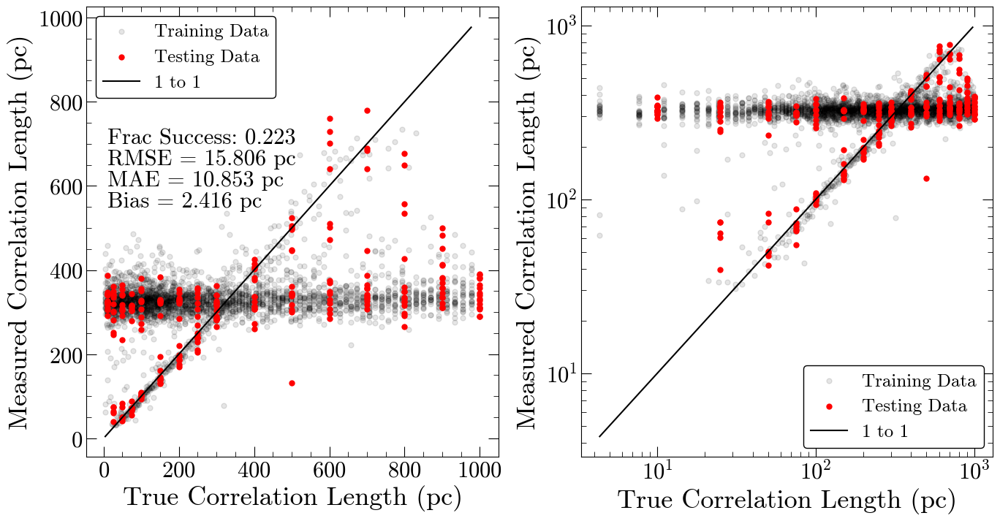

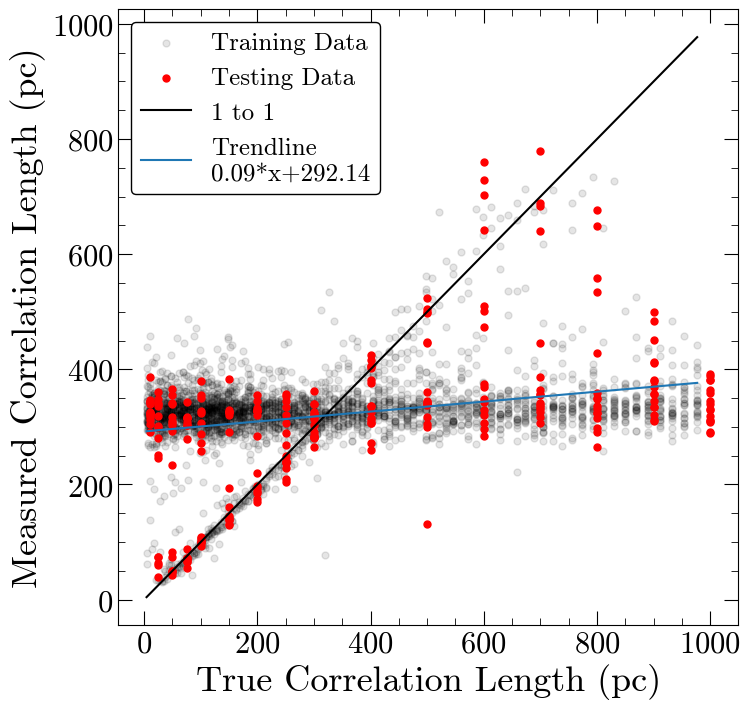

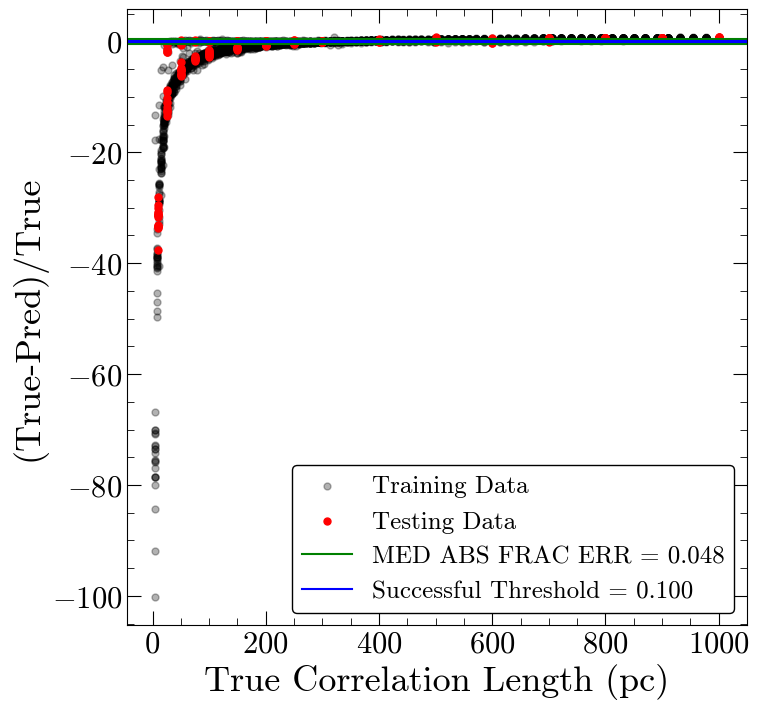

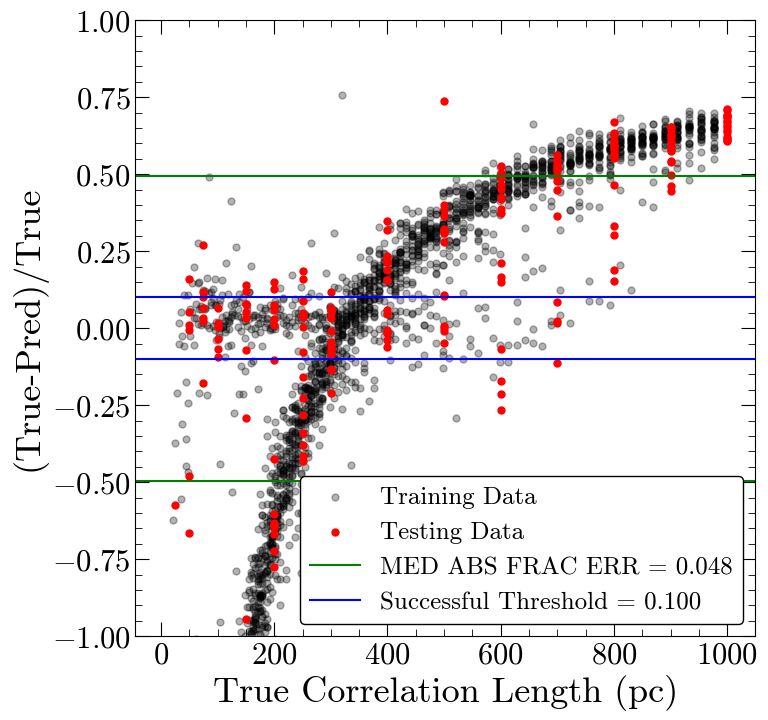

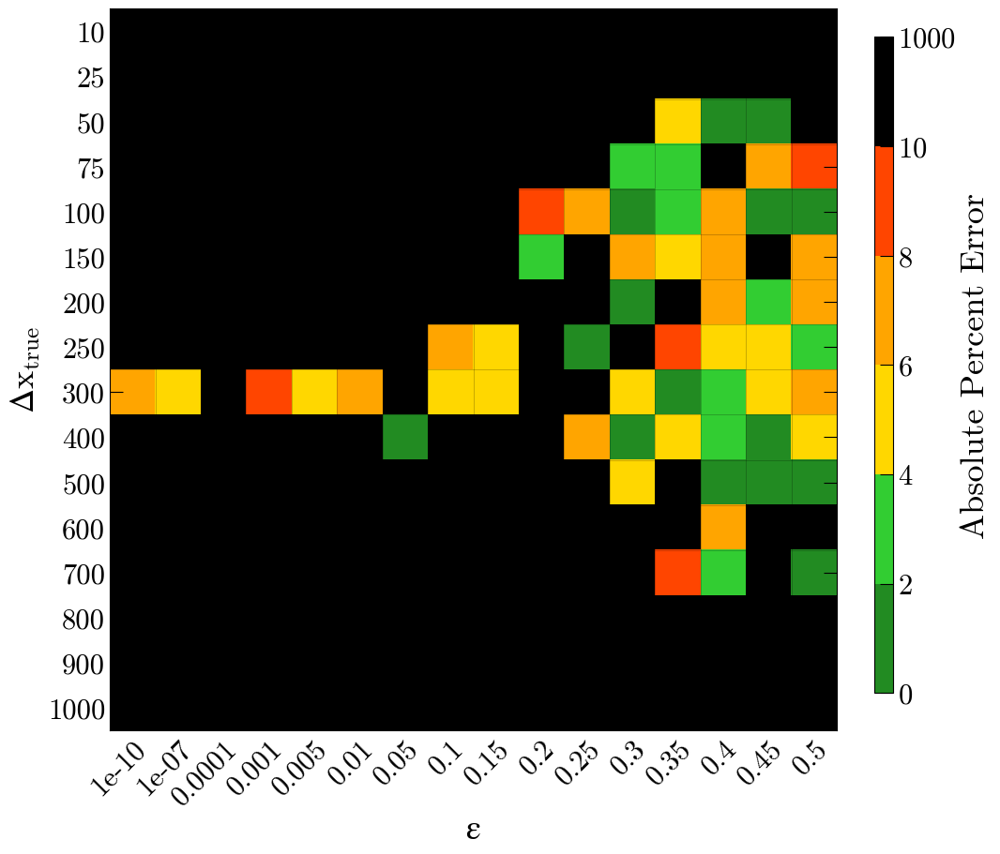

Number of squares with abs percent err>10%,  199


In [42]:
#model with even more layers, run for even more epochs, increase batch size even more
model = Sequential([
    Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
    MaxPooling1D(2), 
    Conv1D(64, 3, activation='relu'),
    MaxPooling1D(2), 
    Conv1D(128, 3, activation='relu'), 
    MaxPooling1D(2), 
    Flatten(), 
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(1) 
])

model.compile(optimizer='adam', loss='mse')

model.fit(x_train, y_train, epochs=400, batch_size=300)

output=test_model(model)

#save the most important stats
all_model_stats = pd.concat([all_model_stats, output])

# Save best model

In [43]:
#reset the indices
indices=np.arange(0,len(all_model_stats))
all_model_stats.set_index(indices,inplace=True)
#round all values
all_model_stats=all_model_stats.round(2)

print('Min MAE Training')
print(all_model_stats['mae_training'].idxmin(),', min val=',min(all_model_stats['mae_training']))
print('')

print('Max Frac Success Training')
print(all_model_stats['frac_success_training'].idxmax(),', max val=',max(all_model_stats['frac_success_training']))
print('')

print('Min MAE Testing')
print(all_model_stats['mae_testing'].idxmin(),', min val=',min(all_model_stats['mae_testing']))
print('')

print('Max Frac Success Testing')
print(all_model_stats['frac_success_testing'].idxmax(),', max val=',max(all_model_stats['frac_success_testing']))
print('')

display(all_model_stats)

#best model option is 9


Min MAE Training
9 , min val= 152.13

Max Frac Success Training
9 , max val= 0.15

Min MAE Testing
9 , min val= 148.29

Max Frac Success Testing
6 , max val= 0.25



,mae_training,frac_success_training,mae_testing,frac_success_testing
0,197.89,0.10,210.69,0.15
1,191.30,0.11,181.97,0.15
2,174.39,0.12,194.42,0.19
3,165.65,0.12,157.92,0.21
4,184.53,0.12,196.94,0.20
5,171.31,0.12,191.01,0.20
6,166.44,0.13,152.76,0.25
7,181.19,0.14,176.59,0.20
8,162.96,0.14,166.61,0.22
9,152.13,0.15,148.29,0.20


In [45]:
#choose model 8 which is the best option across all runs

failed_fit_region_count=500

while failed_fit_region_count>199:
    #model with even more layers, run for even more epochs
    final_model = Sequential([
        Conv1D(32, 3, activation='relu', input_shape=(x_train.shape[1], 1)), 
        MaxPooling1D(2), 
        Conv1D(64, 3, activation='relu'),
        MaxPooling1D(2), 
        Conv1D(128, 3, activation='relu'), 
        MaxPooling1D(2), 
        Flatten(), 
        Dense(128, activation='relu'),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(1) 
    ])

    final_model.compile(optimizer='adam', loss='mse')

    final_model.fit(x_train, y_train, epochs=400, batch_size=32)

    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(final_model,stats=False,plot=False)
    
    print('')
    print(failed_fit_region_count)
    print('')

Epoch 1/400
92/92 [==============================] - 1s 6ms/step - loss: 95467.8750
Epoch 2/400
92/92 [==============================] - 1s 6ms/step - loss: 68136.3672
Epoch 3/400
92/92 [==============================] - 1s 7ms/step - loss: 68351.4609
Epoch 4/400
92/92 [==============================] - 1s 8ms/step - loss: 67953.8906
Epoch 5/400
92/92 [==============================] - 1s 7ms/step - loss: 67415.9453
Epoch 6/400
92/92 [==============================] - 1s 8ms/step - loss: 68482.8828
Epoch 7/400
92/92 [==============================] - 1s 8ms/step - loss: 67798.7188
Epoch 8/400
92/92 [==============================] - 1s 11ms/step - loss: 67127.5234
Epoch 9/400
92/92 [==============================] - 1s 7ms/step - loss: 66762.5469
Epoch 10/400
92/92 [==============================] - 1s 8ms/step - loss: 67037.0391
Epoch 11/400
92/92 [==============================] - 1s 8ms/step - loss: 66713.9531
Epoch 12/400
92/92 [==============================] - 1s 8ms/step - loss:

Epoch 97/400
92/92 [==============================] - 1s 10ms/step - loss: 62763.1680
Epoch 98/400
92/92 [==============================] - 1s 15ms/step - loss: 62456.0742
Epoch 99/400
92/92 [==============================] - 2s 18ms/step - loss: 62475.4922
Epoch 100/400
92/92 [==============================] - 2s 18ms/step - loss: 62225.0352
Epoch 101/400
92/92 [==============================] - 1s 16ms/step - loss: 62055.7461
Epoch 102/400
92/92 [==============================] - 1s 16ms/step - loss: 62395.7266
Epoch 103/400
92/92 [==============================] - 1s 12ms/step - loss: 62310.7578
Epoch 104/400
92/92 [==============================] - 1s 10ms/step - loss: 62210.3867
Epoch 105/400
92/92 [==============================] - 1s 13ms/step - loss: 62305.0586
Epoch 106/400
92/92 [==============================] - 1s 13ms/step - loss: 62330.1211
Epoch 107/400
92/92 [==============================] - 1s 15ms/step - loss: 62250.6797
Epoch 108/400
92/92 [=========================

92/92 [==============================] - 1s 14ms/step - loss: 59650.5859
Epoch 286/400
92/92 [==============================] - 1s 12ms/step - loss: 59749.4336
Epoch 287/400
92/92 [==============================] - 1s 15ms/step - loss: 59455.7578
Epoch 288/400
92/92 [==============================] - 1s 13ms/step - loss: 59447.6797
Epoch 289/400
92/92 [==============================] - 1s 15ms/step - loss: 59405.6133
Epoch 290/400
92/92 [==============================] - 1s 15ms/step - loss: 59874.0664
Epoch 291/400
92/92 [==============================] - 1s 14ms/step - loss: 59327.9883
Epoch 292/400
92/92 [==============================] - 1s 13ms/step - loss: 59491.8711
Epoch 293/400
92/92 [==============================] - 1s 13ms/step - loss: 59350.1953
Epoch 294/400
92/92 [==============================] - 1s 15ms/step - loss: 59782.3203
Epoch 295/400
92/92 [==============================] - 1s 12ms/step - loss: 59668.1367
Epoch 296/400
92/92 [==============================] - 1s

92/92 [==============================] - 1s 11ms/step - loss: 62851.4883
Epoch 75/400
92/92 [==============================] - 1s 10ms/step - loss: 62990.4492
Epoch 76/400
92/92 [==============================] - 1s 14ms/step - loss: 63035.1914
Epoch 77/400
92/92 [==============================] - 1s 14ms/step - loss: 63190.8906
Epoch 78/400
92/92 [==============================] - 1s 13ms/step - loss: 62855.5391
Epoch 79/400
92/92 [==============================] - 1s 15ms/step - loss: 62737.2344
Epoch 80/400
92/92 [==============================] - 1s 16ms/step - loss: 62820.9688
Epoch 81/400
92/92 [==============================] - 1s 14ms/step - loss: 62791.1719
Epoch 82/400
92/92 [==============================] - 1s 12ms/step - loss: 62634.0195
Epoch 83/400
92/92 [==============================] - 1s 13ms/step - loss: 62628.3828
Epoch 84/400
92/92 [==============================] - 1s 14ms/step - loss: 63109.8789
Epoch 85/400
92/92 [==============================] - 1s 13ms/step 

92/92 [==============================] - 1s 11ms/step - loss: 59849.5703
Epoch 263/400
92/92 [==============================] - 1s 10ms/step - loss: 59840.0391
Epoch 264/400
92/92 [==============================] - 1s 9ms/step - loss: 59962.0938
Epoch 265/400
92/92 [==============================] - 1s 10ms/step - loss: 59895.6680
Epoch 266/400
92/92 [==============================] - 1s 10ms/step - loss: 60416.8008
Epoch 267/400
92/92 [==============================] - 1s 10ms/step - loss: 59616.0781
Epoch 268/400
92/92 [==============================] - 1s 9ms/step - loss: 59369.5625
Epoch 269/400
92/92 [==============================] - 1s 10ms/step - loss: 59884.0000
Epoch 270/400
92/92 [==============================] - 1s 9ms/step - loss: 59753.8086
Epoch 271/400
92/92 [==============================] - 1s 9ms/step - loss: 59700.5586
Epoch 272/400
92/92 [==============================] - 1s 10ms/step - loss: 59315.5312
Epoch 273/400
92/92 [==============================] - 1s 10m

92/92 [==============================] - 1s 7ms/step - loss: 52933.3516
Epoch 358/400
92/92 [==============================] - 1s 7ms/step - loss: 52865.0117
Epoch 359/400
92/92 [==============================] - 1s 8ms/step - loss: 52118.5000
Epoch 360/400
92/92 [==============================] - 1s 7ms/step - loss: 52671.5078
Epoch 361/400
92/92 [==============================] - 1s 7ms/step - loss: 53339.6445
Epoch 362/400
92/92 [==============================] - 1s 7ms/step - loss: 52042.6445
Epoch 363/400
92/92 [==============================] - 1s 7ms/step - loss: 52258.6406
Epoch 364/400
92/92 [==============================] - 1s 6ms/step - loss: 52386.9453
Epoch 365/400
92/92 [==============================] - 1s 7ms/step - loss: 52694.3320
Epoch 366/400
92/92 [==============================] - 1s 7ms/step - loss: 52150.7812
Epoch 367/400
92/92 [==============================] - 1s 6ms/step - loss: 52655.2656
Epoch 368/400
92/92 [==============================] - 1s 7ms/step -

In [46]:
#save the model
nb='05'
final_model.save('csv/nb05_sample_size_10207/'+nb+'_final_model')

INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/05_final_model/assets


INFO:tensorflow:Assets written to: csv/nb05_sample_size_10207/05_final_model/assets


In [49]:
def final_plot(nb,title,statx=10,staty=700,statdy=50,lim='default', siegel=True,success_fit_threshold=0.1):
    
    loaded_model = load_model('csv/nb05_sample_size_10207/'+nb+'_final_model')
    failed_fit_region_count,mae_testing_success,training_data,testing_data,nan_corr_lengths=test_model(loaded_model,stats=False,plot=False)
    
    # use the model to predict the training data
    y_pred_train = loaded_model.predict(x_train, verbose=0)
    training_data['y_pred']=y_pred_train
    
    # use the model to predict the training data
    y_pred_test = loaded_model.predict(x_test, verbose=0)
    testing_data['y_pred']=y_pred_test
    
    #drop the failed fits
    testing_data=testing_data.dropna()
    #reset the indices
    indices=np.arange(0,len(testing_data))
    testing_data.set_index(indices,inplace=True)
    
    y_true_training=training_data['y_true']
    y_pred_training=training_data['y_pred']
    y_true_testing=testing_data['y_true']
    y_pred_testing=testing_data['y_pred']
    
    unit='pc'
    
    #calculate stats
    rmse_training,mae_training,bias_training,med_frac_training,error_training,frac_err_training,frac_success=comparison_stats(training_data,False)
    rmse_training_success,mae_training_success,bias_training_success,med_frac_training_success,error_training_success,frac_err_training_success,frac_success_training=comparison_stats(training_data,False,True,success_fit_threshold)
    rmse_testing,mae_testing,bias_testing,med_frac_testing,error_testing,frac_err_testing,frac_success=comparison_stats(testing_data,False)
    rmse_testing_success,mae_testing_success,bias_testing_success,med_frac_testing_success,error_testing_success,frac_err_testing_success,frac_success_testing=comparison_stats(testing_data,False,True,success_fit_threshold)
    
    #plot the agreement with stats
    fig, ((ax1),(ax2)) =plt.subplots(2,1,figsize=(8,16),sharex=True)
    ax1.scatter(y_true_training,y_pred_training,c='k',alpha=0.1,label='Training Data')
    ax1.scatter(y_true_testing,y_pred_testing,c='r',label='Testing Data')
    #ax1.errorbar(y_true_testing,y_pred_testing,yerr=e_y_pred_testing,fmt='o',color='red',ecolor = 'red',label='Testing Data')
    ax1.text(statx, staty, 'Frac Success: {:2.3f} '.format(frac_success_testing))
    ax1.text(statx, staty-1*statdy, 'RMSE = {:.3f} '.format(rmse_testing_success)+unit)
    ax1.text(statx, staty-2*statdy, 'MAE = {:.3f} '.format(mae_testing_success)+unit)
    ax1.text(statx, staty-3*statdy, 'Bias = {:.3f} '.format(bias_testing_success)+unit)
    ax1.set_ylabel(r'Predicted Correlation Length (pc)')
    maxval=max(max(y_true_training),max(y_pred_training))
    minval=min(min(y_true_training),min(y_pred_training))
    #plot 1 to 1 trendline
    ax1.plot([minval,maxval], [minval,maxval], color = 'black',label="1 to 1")
    ax1.legend()
    if lim!='default':
        ax1.set_xlim((lim[0],lim[1]))
        ax1.set_ylim((lim[0],lim[1]))
    
    # plot the fractional error between the datasets zoomed in
    ax2.scatter(y_true_training, frac_err_training,c='k',alpha=0.3,label='Training Data')
    ax2.scatter(y_true_testing, frac_err_testing,c='r',label='Testing Data')
    ax2.axhline(0,color='black')
    ax2.axhline(med_frac_testing,color='green',label='Median Absolute\nFractional Error = {:.3f}'.format(med_frac_testing_success))
    ax2.axhline(-med_frac_testing,color='green')
    ax2.axhline(success_fit_threshold,color='blue',label='Successful Threshold = {:.1f}'.format(success_fit_threshold))
    ax2.axhline(-success_fit_threshold,color='blue')
    ax2.set_xlabel(r'True Correlation Length (pc)')
    ax2.set_ylabel(r'($\lambda_{True}-\lambda_{Pred})/\lambda_{True}$')
    ax2.set_ylim((-1,1))
    ax2.legend()
    
    ax1.set_title(title)
    
    plt.subplots_adjust(wspace = 0,hspace=0)
    plt.show()
    
    #make and save the heatmap, which is the figure that will be included in the paper
    failed_fit_region_count=heatmap_testing_data(testing_data,title,savefig=True,figname=nb+'_cnn_heatmap')
    

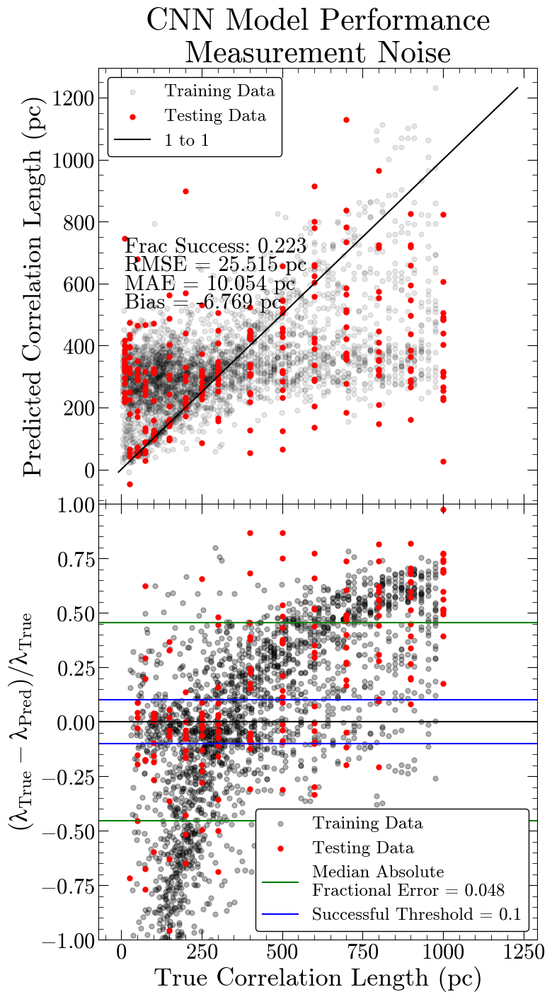

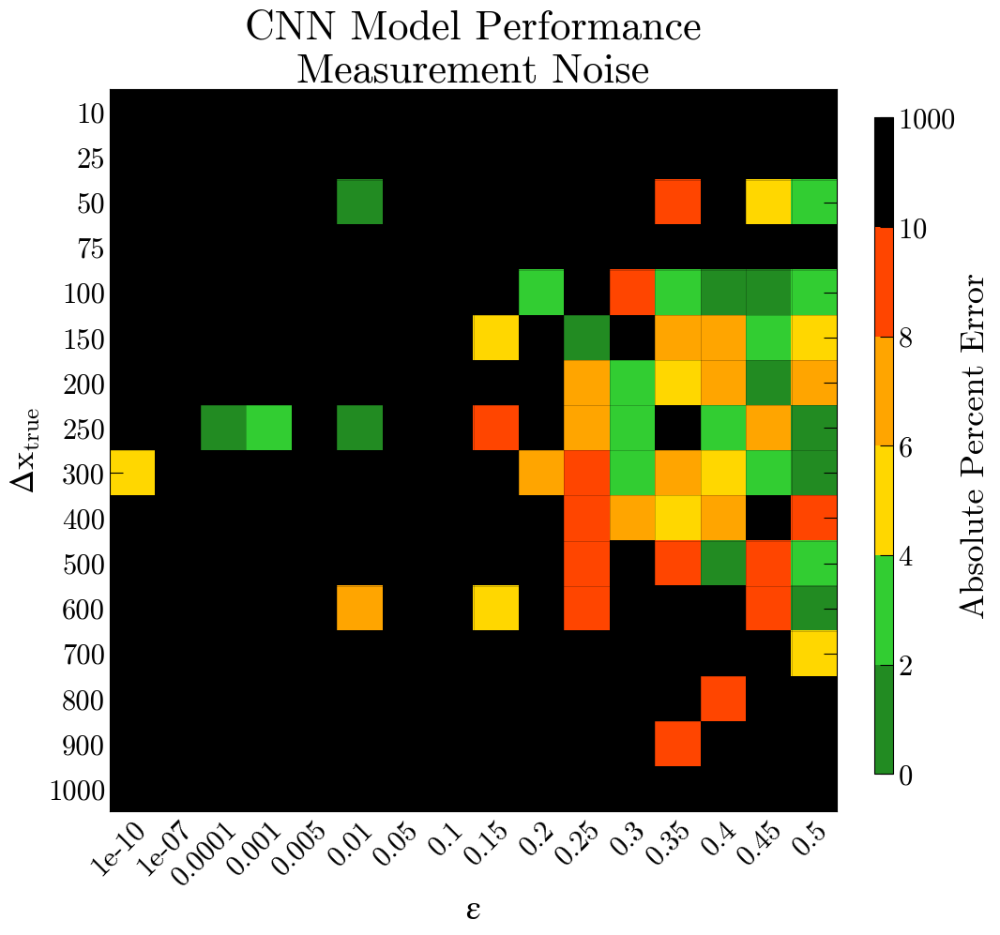

Number of squares with abs percent err>10%,  199


In [50]:
final_plot('05','CNN Model Performance\nMeasurement Noise',statdy=60)